## EDA

In [2]:
library(magrittr)
library(tidymodels)
library(tidyverse)
library(skimr)
library(knitr)
library(dplyr)
library(janitor)
library(lubridate)
library(gridExtra)
library(GGally)
library(ggpubr)
library(xgboost)
library(MASS)

In [2]:
train <- read.csv("/Users/gimdong-wan/Desktop/공모전/DACON/구내식당 식수인원 예측/data/train.csv")
test <- read.csv("/Users/gimdong-wan/Desktop/공모전/DACON/구내식당 식수인원 예측/data/test.csv")

In [3]:
summary(train)

     일자               요일             본사정원수    본사휴가자수   
 Length:1205        Length:1205        Min.   :2601   Min.   :  23.0  
 Class :character   Class :character   1st Qu.:2645   1st Qu.:  71.0  
 Mode  :character   Mode  :character   Median :2760   Median : 105.0  
                                       Mean   :2808   Mean   : 157.9  
                                       3rd Qu.:2962   3rd Qu.: 185.0  
                                       Max.   :3305   Max.   :1224.0  
  본사출장자수   본사시간외근무명령서승인건수 현본사소속재택근무자수
 Min.   : 41.0   Min.   :   0.0               Min.   :  0.00        
 1st Qu.:217.0   1st Qu.:   4.0               1st Qu.:  0.00        
 Median :245.0   Median : 299.0               Median :  0.00        
 Mean   :241.1   Mean   : 274.1               Mean   : 43.51        
 3rd Qu.:272.0   3rd Qu.: 452.0               3rd Qu.:  0.00        
 Max.   :378.0   Max.   :1044.0               Max.   :533.00        
   조식메뉴           중식메뉴           석식메뉴             중식계      
 Lengt

In [4]:
summary(test)

     일자               요일             본사정원수    본사휴가자수   
 Length:50          Length:50          Min.   :2924   Min.   : 50.00  
 Class :character   Class :character   1st Qu.:2924   1st Qu.: 78.25  
 Mode  :character   Mode  :character   Median :2974   Median : 95.00  
                                       Mean   :2957   Mean   :129.52  
                                       3rd Qu.:2975   3rd Qu.:137.50  
                                       Max.   :2983   Max.   :489.00  
  본사출장자수   본사시간외근무명령서승인건수 현본사소속재택근무자수
 Min.   :131.0   Min.   :   0.0               Min.   :179.0         
 1st Qu.:176.5   1st Qu.:   1.0               1st Qu.:257.2         
 Median :202.5   Median : 465.5               Median :300.0         
 Mean   :209.2   Mean   : 380.1               Mean   :298.1         
 3rd Qu.:245.2   3rd Qu.: 681.0               3rd Qu.:333.2         
 Max.   :279.0   Max.   :1003.0               Max.   :413.0         
   조식메뉴           중식메뉴           석식메뉴        
 Length:50          

In [7]:
colnames(train)

[1] "일자"                         "요일"                        
 [3] "본사정원수"                   "본사휴가자수"                
 [5] "본사출장자수"                 "본사시간외근무명령서승인건수"
 [7] "현본사소속재택근무자수"       "조식메뉴"                    
 [9] "중식메뉴"                     "석식메뉴"                    
[11] "중식계"                       "석식계"

#### 조식메뉴, 중식메뉴, 석식메뉴는 핸들링하기 한계가 있어 삭제하고 분석하려고 합니다.

In [35]:
train$일자 = as.Date(train$일자)
test$일자 <- as.Date(test$일자)

In [36]:
train_year <- year(train$일자)
train_month <- month(train$일자)
train_day <- day(train$일자)
train_ym <- format(train$일자,"%Y-%m")
test_year <- year(test$일자)
test_month <- month(test$일자)
test_day <- day(test$일자)
test_ym <- format(test$일자,"%Y-%m")

In [37]:
train_date <- data.frame(train_year,train_month,train_day,train_ym)
test_date <- data.frame(test_year,test_month,test_day,test_ym)

In [38]:
train <- cbind(train,train_date)
test <- cbind(test,test_date)

In [39]:
train[train$석식계==0,]

,일자,요일,본사정원수,본사휴가자수,본사출장자수,본사시간외근무명령서승인건수,현본사소속재택근무자수,중식계,석식계,train_year,train_month,train_day,train_ym
,<date>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
205,2016-11-30,수,2689,68,207,0,0,1109,0,2016,11,30,2016-11
225,2016-12-28,수,2705,166,225,0,0,767,0,2016,12,28,2016-12
245,2017-01-25,수,2697,79,203,0,0,720,0,2017,1,25,2017-01
263,2017-02-22,수,2632,75,252,0,0,1065,0,2017,2,22,2017-02
282,2017-03-22,수,2627,53,235,0,0,953,0,2017,3,22,2017-03
307,2017-04-26,수,2626,45,304,0,0,835,0,2017,4,26,2017-04
328,2017-05-31,수,2637,43,265,0,0,910,0,2017,5,31,2017-05
347,2017-06-28,수,2648,58,259,0,0,745,0,2017,6,28,2017-06
367,2017-07-26,수,2839,254,246,0,0,797,0,2017,7,26,2017-07


In [40]:
train[train$train_day>24&train$요일=='수',]
test[test$test_day>24&test$요일=='수',]

,일자,요일,본사정원수,본사휴가자수,본사출장자수,본사시간외근무명령서승인건수,현본사소속재택근무자수,중식계,석식계,train_year,train_month,train_day,train_ym
,<date>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
39,2016-03-30,수,2624,48,230,0,0,1033,463,2016,3,30,2016-03
58,2016-04-27,수,2643,71,234,0,0,1028,490,2016,4,27,2016-04
76,2016-05-25,수,2635,72,258,0,0,938,454,2016,5,25,2016-05
100,2016-06-29,수,2637,67,248,0,0,820,487,2016,6,29,2016-06
120,2016-07-27,수,2643,299,192,0,0,872,423,2016,7,27,2016-07
144,2016-08-31,수,2644,98,236,0,0,915,498,2016,8,31,2016-08
161,2016-09-28,수,2769,50,225,0,0,1128,591,2016,9,28,2016-09
180,2016-10-26,수,2670,89,258,0,0,854,410,2016,10,26,2016-10
205,2016-11-30,수,2689,68,207,0,0,1109,0,2016,11,30,2016-11


,일자,요일,본사정원수,본사휴가자수,본사출장자수,본사시간외근무명령서승인건수,현본사소속재택근무자수,test_year,test_month,test_day,test_ym
,<date>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<int>,<chr>
1,2021-01-27,수,2983,88,182,5,358,2021,1,27,2021-01
43,2021-03-31,수,2975,86,217,0,317,2021,3,31,2021-03


#### 일자 데이터를 나눠서 연, 월, 일로 구분합니다.

In [41]:
train = train%>%mutate(출근자 = train$본사정원수-train$본사휴가자수-train$현본사소속재택근무자수)
test = test%>%mutate(출근자 = test$본사정원수-test$본사휴가자수-test$현본사소속재택근무자수)

In [42]:
train = train%>%mutate(출근비율 = 100*train$출근자/train$본사정원수)
test = test%>%mutate(출근비율 = 100*test$출근자/test$본사정원수)

#### 실제 출근자와 출근 비율로 나눈 후 행에 추가했습니다.

In [43]:
colnames(train)=c('date', 'dow', 'all', 'vac','bus_trip','night','home','lun_num', 'din_num', 'year', 'month', 'day','ym','work','work_rate')

In [44]:
colnames(test)=c('date', 'dow', 'all', 'vac','bus_trip','night','home', 'year', 'month', 'day','ym','work','work_rate')

In [45]:
train[train$dow == '월', 'dow'] = 1
train[train$dow == '화', 'dow'] = 2
train[train$dow == '수', 'dow'] = 3
train[train$dow == '목', 'dow'] = 4
train[train$dow == '금', 'dow'] = 5

In [88]:
test[test$dow == '월', 'dow'] = 1
test[test$dow == '화', 'dow'] = 2
test[test$dow == '수', 'dow'] = 3
test[test$dow == '목', 'dow'] = 4
test[test$dow == '금', 'dow'] = 5

#### 변수명을 변경하고 요일은 한글일 때 그래프가 깨질 수 있어, 수치로 변환했습니다.

In [20]:
train%>%head(1)
test%>%head(1)

,date,dow,all,vac,bus_trip,night,home,lun_num,din_num,year,month,day,ym,work,work_rate
,<date>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<dbl>,<dbl>
1,2016-02-01,1,2601,50,150,238,0,1039,331,2016,2,1,2016-02,2551,98.07766


,date,dow,all,vac,bus_trip,night,home,year,month,day,ym,work,work_rate
,<date>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<dbl>,<dbl>
1,2021-01-27,3,2983,88,182,5,358,2021,1,27,2021-01,2537,85.04861


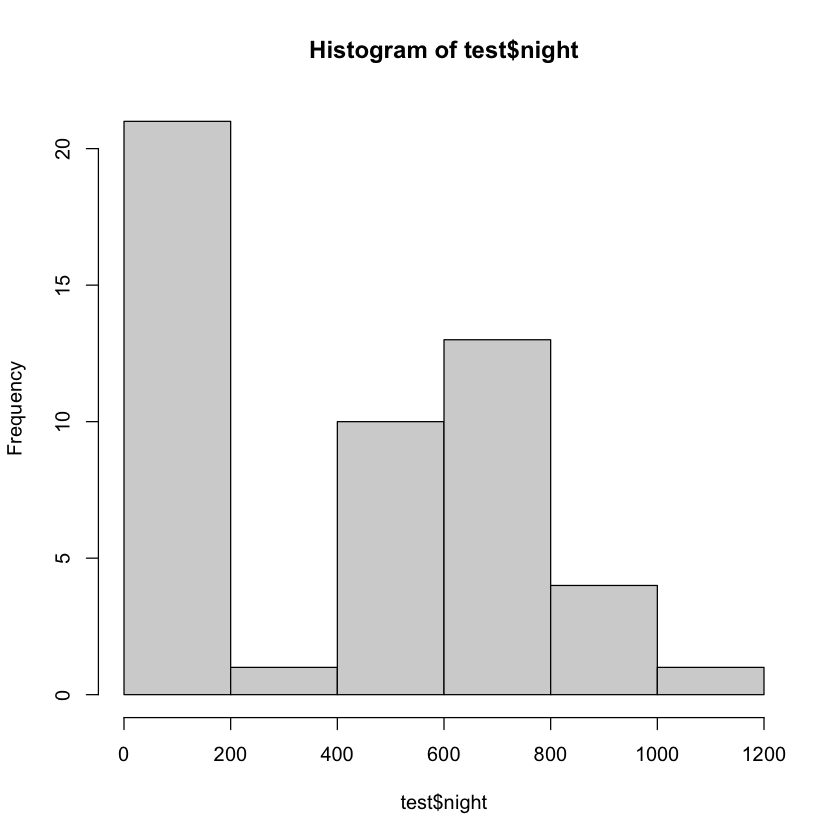

In [21]:
hist(test$night)

In [22]:
skim(train)

─ Data Summary ────────────
                           Values
Name                       train 
Number of rows             1205  
Number of columns          15    
_______________________          
Column type frequency:           
  character                2     
  Date                     1     
  numeric                  12    
________________________         
Group variables            None  

─ Variable type: character ──────────────────────────
  skim_variable n_missing complete_rate   min   max empty n_unique whitespace
1 dow                   0             1     1     1     0        5          0
2 ym                    0             1     7     7     0       60          0

─ Variable type: Date ─────────────────────────────
  skim_variable n_missing complete_rate min        max        median    
1 date                  0             1 2016-02-01 2021-01-26 2018-07-16
  n_unique
1     1205

─ Variable type: numeric ───────────────────────────
   skim_variable n_missing complet

In [23]:
train[train$month==2,]

,date,dow,all,vac,bus_trip,night,home,lun_num,din_num,year,month,day,ym,work,work_rate
,<date>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<dbl>,<dbl>
1,2016-02-01,1,2601,50,150,238,0,1039,331,2016,2,1,2016-02,2551,98.07766
2,2016-02-02,2,2601,50,173,319,0,867,560,2016,2,2,2016-02,2551,98.07766
3,2016-02-03,3,2601,56,180,111,0,1017,573,2016,2,3,2016-02,2545,97.84698
4,2016-02-04,4,2601,104,220,355,0,978,525,2016,2,4,2016-02,2497,96.00154
5,2016-02-05,5,2601,278,181,34,0,925,330,2016,2,5,2016-02,2323,89.31180
6,2016-02-11,4,2601,383,143,417,0,1045,550,2016,2,11,2016-02,2218,85.27489
7,2016-02-12,5,2601,389,156,93,0,909,598,2016,2,12,2016-02,2212,85.04421
8,2016-02-15,1,2601,87,204,482,0,1268,672,2016,2,15,2016-02,2514,96.65513
9,2016-02-16,2,2601,72,236,526,0,1014,523,2016,2,16,2016-02,2529,97.23183


In [24]:
summary(train[train$month==3,])

      date                dow                 all            vac        
 Min.   :2016-03-02   Length:107         Min.   :2624   Min.   : 36.00  
 1st Qu.:2017-03-08   Class :character   1st Qu.:2627   1st Qu.: 52.00  
 Median :2018-03-15   Mode  :character   Median :2714   Median : 72.00  
 Mean   :2018-03-09                      Mean   :2749   Mean   : 96.72  
 3rd Qu.:2019-03-23                      3rd Qu.:2836   3rd Qu.:120.00  
 Max.   :2020-03-31                      Max.   :2950   Max.   :840.00  
    bus_trip         night            home           lun_num      
 Min.   : 43.0   Min.   :  0.0   Min.   :  0.00   Min.   : 481.0  
 1st Qu.:210.5   1st Qu.:  4.0   1st Qu.:  0.00   1st Qu.: 838.0  
 Median :238.0   Median :329.0   Median :  0.00   Median : 956.0  
 Mean   :231.5   Mean   :302.2   Mean   : 26.62   Mean   : 953.6  
 3rd Qu.:259.5   3rd Qu.:523.5   3rd Qu.:  0.00   3rd Qu.:1048.5  
 Max.   :307.0   Max.   :789.0   Max.   :533.00   Max.   :1362.0  
    din_num         

- 일자
    - train data는 2016년 02월 01일 ~ 2021년 1월 01월 26일로 구성되어 있습니다.
- 구성원
    - 본사 구성원들은 최소 2601~3305까지 있었습니다. 5년동안 본사 정원이 있었던 것으로 보입니다.
- 휴가자 
    - 휴가자는 최소 23명에서 최대 1224명입니다. 3사분위수가 185명인 것으로 보아 최대값과 차이가 커보입니다.
- 출장자
    - 출장자의 평균은 241명이며, 대체로 균일한 분포를 보일 것 같습니다.
- 야근
    - 야근자는 

In [25]:
train <- train%>%mutate('holi' = 0)
test <- test%>%mutate('holi' = 0)

2016/02/04 -> 2016-02-05 [4>5]  
2016/12/26 -> 2016/12/22, 23 [223 -> 220,221]  
2016/12/28  -> +226  

In [26]:
train[train$lun_num<400,]

,date,dow,all,vac,bus_trip,night,home,lun_num,din_num,year,month,day,ym,work,work_rate,holi
,<date>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<dbl>
311,2017-05-04,4,2637,1224,41,45,0,383,262,2017,5,4,2017-05,1413,53.58362,0
470,2017-12-28,4,2665,240,260,55,0,311,245,2017,12,28,2017-12,2425,90.99437,0
471,2017-12-29,5,2665,489,242,5,0,394,209,2017,12,29,2017-12,2176,81.65103,0
706,2018-12-24,1,2846,894,159,26,0,296,104,2018,12,24,2018-12,1952,68.58749,0
710,2018-12-31,1,2846,1085,132,28,0,332,135,2018,12,31,2018-12,1761,61.87632,0
816,2019-06-07,5,2758,890,219,3,0,389,244,2019,6,7,2019-06,1868,67.73024,0
954,2019-12-27,5,3111,706,236,1,0,387,226,2019,12,27,2019-12,2405,77.30633,0
956,2019-12-31,2,3111,709,149,22,0,349,0,2019,12,31,2019-12,2402,77.20990,0
1130,2020-09-28,1,3132,985,188,81,142,358,165,2020,9,28,2020-09,2005,64.01660,0


In [27]:
train[18,16]=1
train[4,16]=1
train[63,16]=1
train[132,16]=1
train[153,16]=1
train[227,16]=1
train[222,16]=1
train[225,16]=1
train[246,16]=1
train[311,16]=2
train[312,16]=1
train[310,16]=1
train[331,16]=1
train[380,16]=1
train[468,16]=1
train[471,16]=1
train[503,16]=1
train[566,16]=1
train[624,16]=1
train[652,16]=1
train[706,16]=1
train[710,16]=1
train[816,16]=1
train[865,16]=1
train[951,16]=1
train[952,16]=1
train[954,16]=1
train[955,16]=1
train[956,16]=1
train[972,16]=2
train[1039,16]=1
train[1100,16]=1
train[1130,16]=1
train[1188,16]=1
test[11,14]=2
test[21,14]=1

In [28]:
train =train%>%mutate('covid' = ifelse(train$year>=2020,'Y','N'))
train = train%>%mutate('holiday' = ifelse(train$holi>0,'Y','N'))
train$covid <- as.factor(train$covid)
train$holiday <- as.factor(train$holiday)

In [29]:
test =test%>%mutate('covid' = ifelse(test$year>=2020,'Y','N'))
test = test%>%mutate('holiday' = ifelse(test$holi>0,'Y','N'))
test$covid <- as.factor(test$covid)
test$holiday <- as.factor(test$holiday)

In [68]:
options(repr.plot.width=9, repr.plot.height=9)

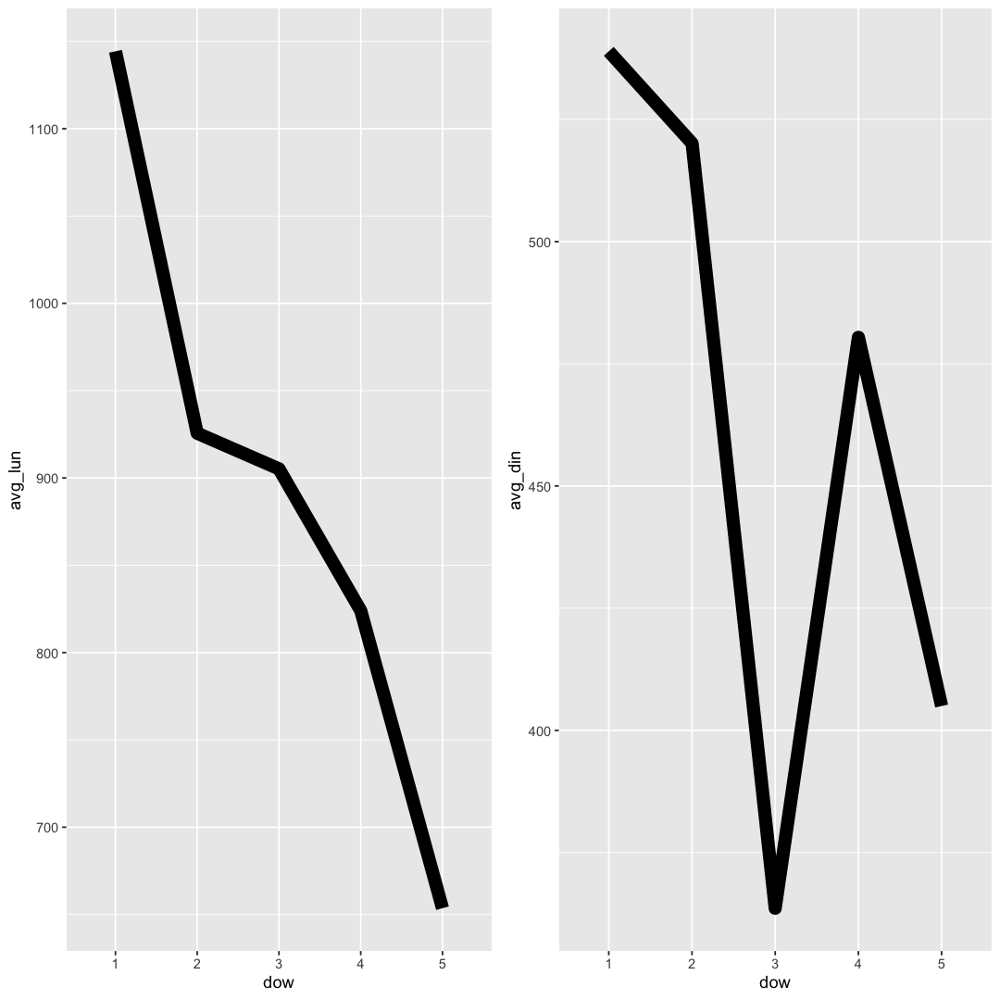

In [31]:
a<- train%>%group_by(dow)%>%summarize(avg_lun=mean(lun_num))%>%
    ggplot(aes(x=dow,y=avg_lun,group=1))+geom_line(size=4)
b<- train%>%group_by(dow)%>%summarize(avg_din=mean(din_num))%>%
    ggplot(aes(x=dow,y=avg_din,group=1))+geom_line(size=4)
ggarrange(a,b)

In [32]:
train[train$dow == 1, 'dow_din'] = 5
train[train$dow == 2, 'dow_din'] = 4
train[train$dow == 3, 'dow_din'] = 1
train[train$dow == 4, 'dow_din'] = 3
train[train$dow == 5, 'dow_din'] = 2

In [33]:
test[test$dow == 1, 'dow_din'] = 5
test[test$dow == 2, 'dow_din'] = 4
test[test$dow == 3, 'dow_din'] = 1
test[test$dow == 4, 'dow_din'] = 3
test[test$dow == 5, 'dow_din'] = 2

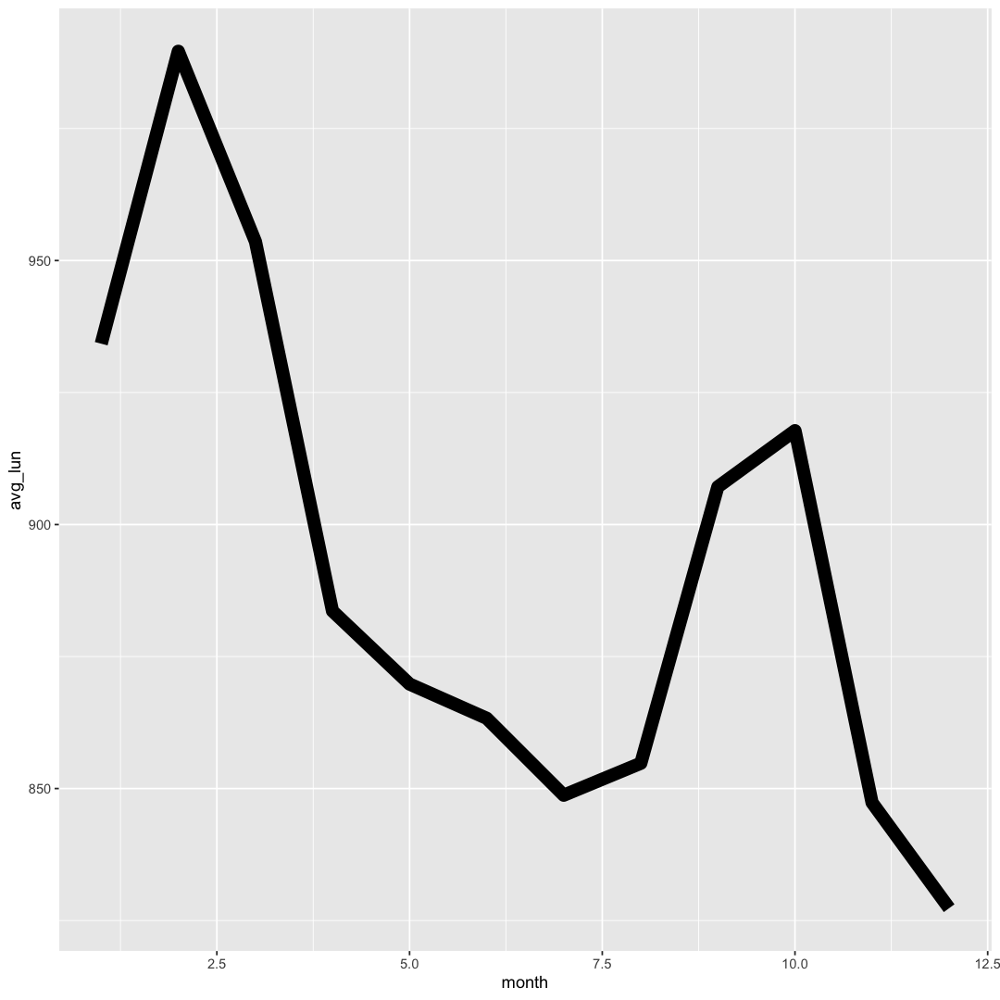

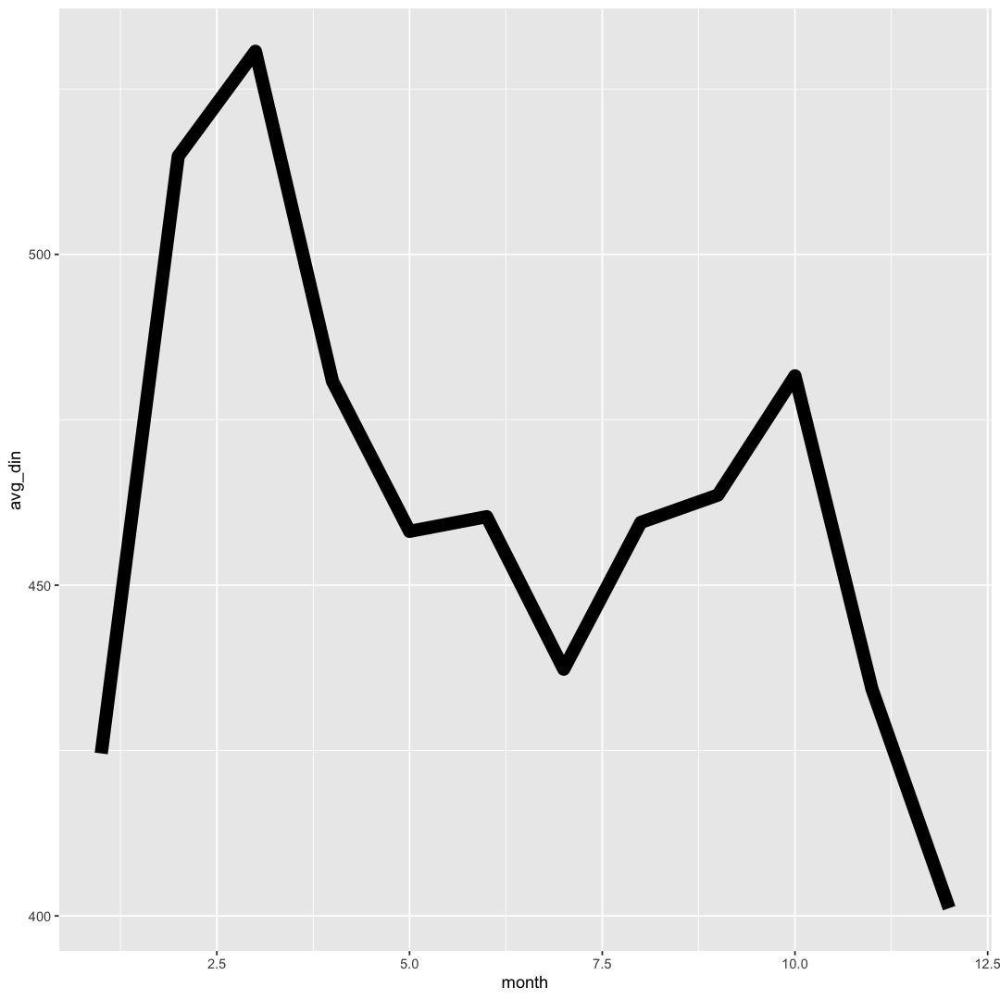

In [34]:
train%>%group_by(month)%>%summarize(avg_lun=mean(lun_num))%>%
    ggplot(aes(x=month,y=avg_lun,group=1))+geom_line(size=4)
train%>%group_by(month)%>%summarize(avg_din=mean(din_num))%>%
    ggplot(aes(x=month,y=avg_din,group=1))+geom_line(size=4)

In [35]:
train[train$month == 1, 'mon_ln'] = 3
train[train$month == 2, 'mon_ln'] = 1
train[train$month == 3, 'mon_ln'] = 2
train[train$month == 4, 'mon_ln'] = 6
train[train$month == 5, 'mon_ln'] = 7
train[train$month == 6, 'mon_ln'] = 8
train[train$month == 7, 'mon_ln'] = 10
train[train$month == 8, 'mon_ln'] = 9
train[train$month == 9, 'mon_ln'] = 5
train[train$month == 10, 'mon_ln'] = 4
train[train$month == 11, 'mon_ln'] = 11
train[train$month == 12, 'mon_ln'] = 12
test[test$month == 1, 'mon_ln'] = 3
test[test$month == 2, 'mon_ln'] = 1
test[test$month == 3, 'mon_ln'] = 2
test[test$month == 4, 'mon_ln'] = 6
test[test$month == 5, 'mon_ln'] = 7
test[test$month == 6, 'mon_ln'] = 8
test[test$month == 7, 'mon_ln'] = 10
test[test$month == 8, 'mon_ln'] = 9
test[test$month == 9, 'mon_ln'] = 5
test[test$month == 10, 'mon_ln'] = 4
test[test$month == 11, 'mon_ln'] = 11
test[test$month == 12, 'mon_ln'] = 12

In [36]:
train[train$month == 1, 'mon_dn'] = 11
train[train$month == 2, 'mon_dn'] = 2
train[train$month == 3, 'mon_dn'] = 1
train[train$month == 4, 'mon_dn'] = 4
train[train$month == 5, 'mon_dn'] = 8
train[train$month == 6, 'mon_dn'] = 6
train[train$month == 7, 'mon_dn'] = 9
train[train$month == 8, 'mon_dn'] = 7
train[train$month == 9, 'mon_dn'] = 5
train[train$month == 10, 'mon_dn'] = 3
train[train$month == 11, 'mon_dn'] = 10
train[train$month == 12, 'mon_dn'] = 12
test[test$month == 1, 'mon_dn'] = 11
test[test$month == 2, 'mon_dn'] = 2
test[test$month == 3, 'mon_dn'] = 1
test[test$month == 4, 'mon_dn'] = 4
test[test$month == 5, 'mon_dn'] = 8
test[test$month == 6, 'mon_dn'] = 6
test[test$month == 7, 'mon_dn'] = 9
test[test$month == 8, 'mon_dn'] = 7
test[test$month == 9, 'mon_dn'] = 5
test[test$month == 10, 'mon_dn'] = 3
test[test$month == 11, 'mon_dn'] = 10
test[test$month == 12, 'mon_dn'] = 12

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



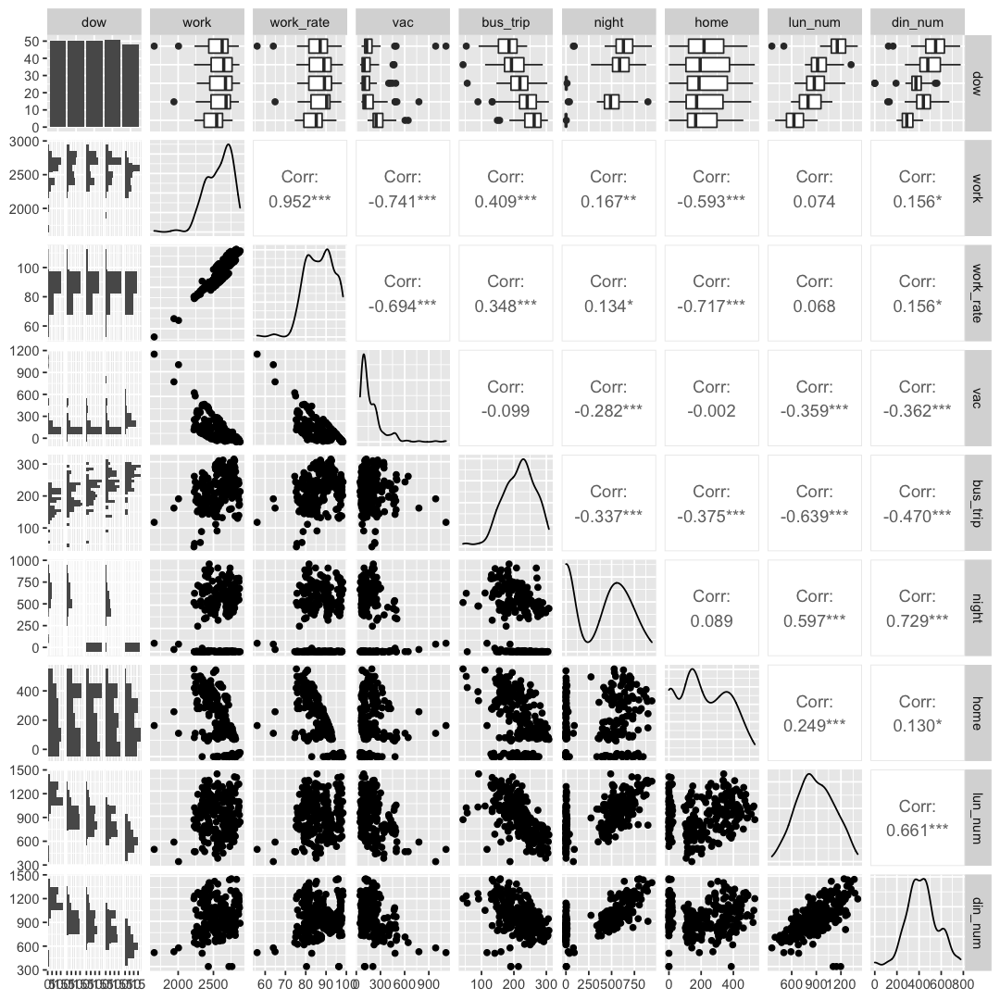

In [95]:
gg<- ggpairs(data = train[train$year>2019,] , columns = c('dow', 'work', 'work_rate','vac','bus_trip','night','home','lun_num','din_num'))

gg[2,1] <- gg[2,1] + geom_histogram(binwidth = 100)
gg[3,1] <- gg[3,1] + geom_histogram(binwidth = 15)
gg[4,1] <- gg[4,1] + geom_histogram(binwidth = 100)
gg[5,1] <- gg[5,1] + geom_histogram(binwidth = 5)
gg[6,1] <- gg[6,1] + geom_histogram(binwidth = 100)
gg[7,1] <- gg[7,1] + geom_histogram(binwidth = 100)
gg[8,1] <- gg[8,1] + geom_histogram(binwidth = 100)
gg[9,1] <- gg[8,1] + geom_histogram(binwidth = 100)

gg

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message in cor(x, y):
“표준편차가 0입니다”
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message in cor(x, y):
“표준편차가 0입니다”
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message in cor(x, y):
“표준편차가 0입니다”
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message in cor(x, y):
“표준편차가 0입니다”
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message in cor(x, y):
“표준편차가 0입니다”
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message in cor(x, y):
“표준편차가 0입니다”
Warning message in cor(x, y):
“표준편차가 0입니다”
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



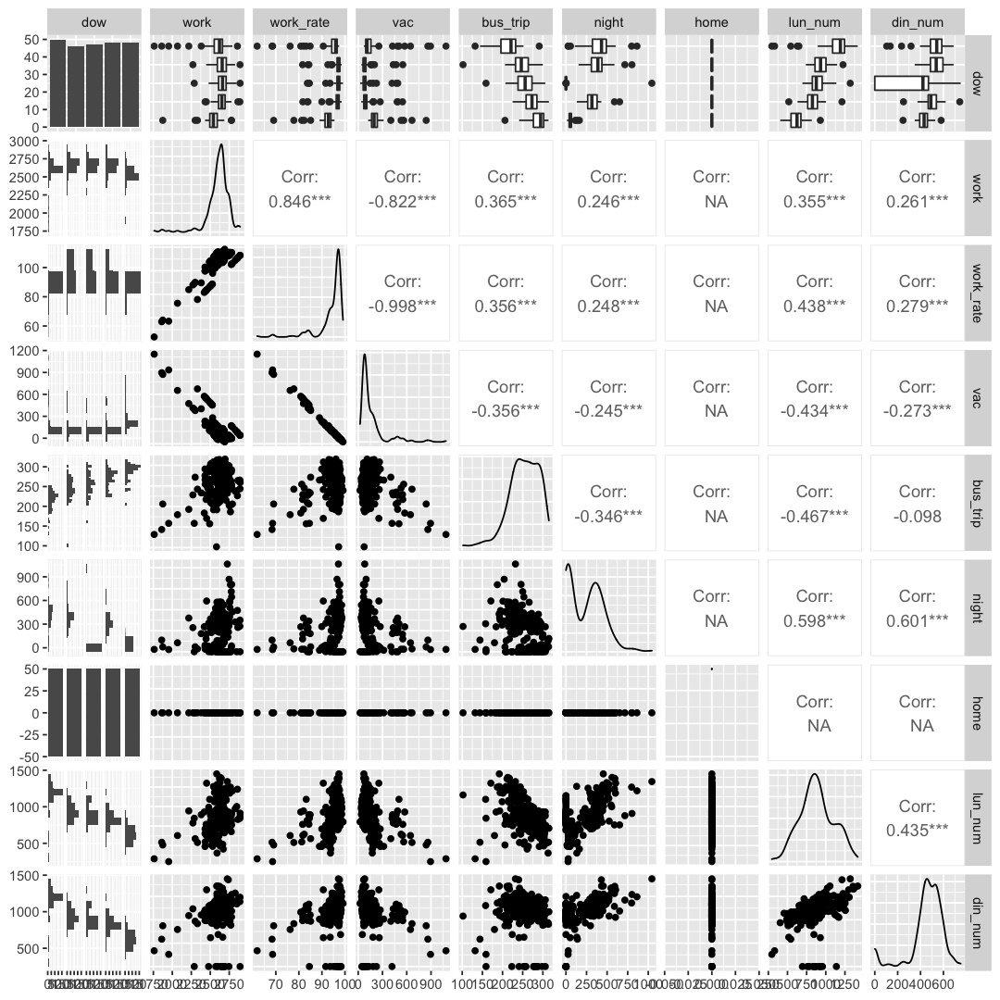

In [96]:
gg<- ggpairs(data = train[train$year==2018,] , columns = c('dow', 'work', 'work_rate','vac','bus_trip','night','home','lun_num','din_num'))

gg[2,1] <- gg[2,1] + geom_histogram(binwidth = 100)
gg[3,1] <- gg[3,1] + geom_histogram(binwidth = 15)
gg[4,1] <- gg[4,1] + geom_histogram(binwidth = 100)
gg[5,1] <- gg[5,1] + geom_histogram(binwidth = 5)
gg[6,1] <- gg[6,1] + geom_histogram(binwidth = 100)
gg[7,1] <- gg[7,1] + geom_histogram(binwidth = 100)
gg[8,1] <- gg[8,1] + geom_histogram(binwidth = 100)
gg[9,1] <- gg[8,1] + geom_histogram(binwidth = 100)

gg

### 변수 간 관계 
- 대체적으로 변수간의 상관관계가 다들 높게 나옵니다.


In [38]:
colnames(train)

[1] "date"      "dow"       "all"       "vac"       "bus_trip"  "night"    
 [7] "home"      "lun_num"   "din_num"   "year"      "month"     "day"      
[13] "ym"        "work"      "work_rate" "holi"      "covid"     "holiday"  
[19] "dow_din"   "mon_ln"    "mon_dn"

In [39]:
options(repr.plot.width=9, repr.plot.height=3)

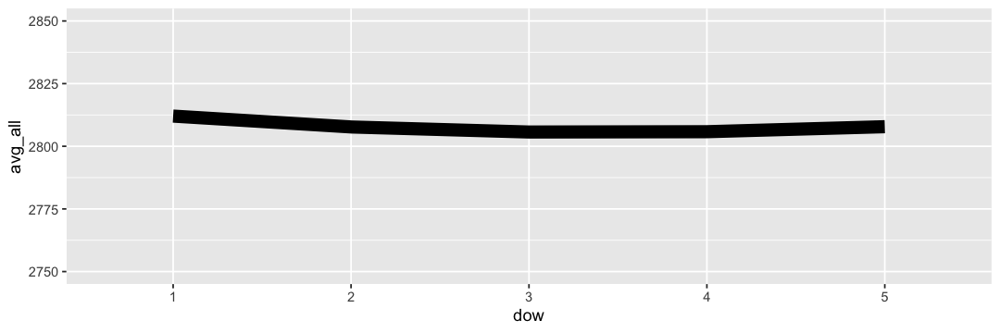

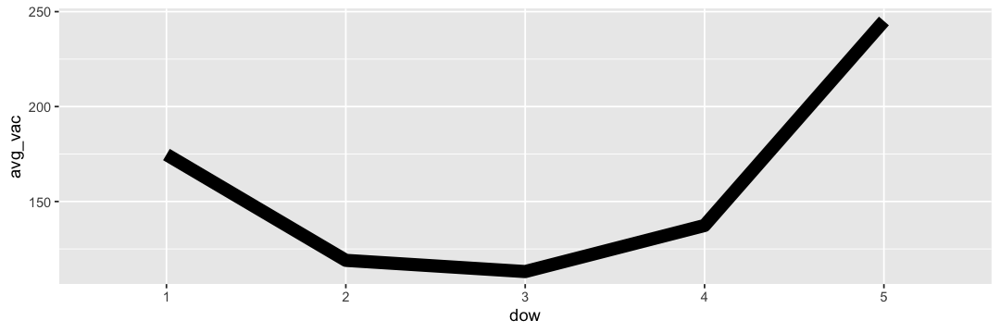

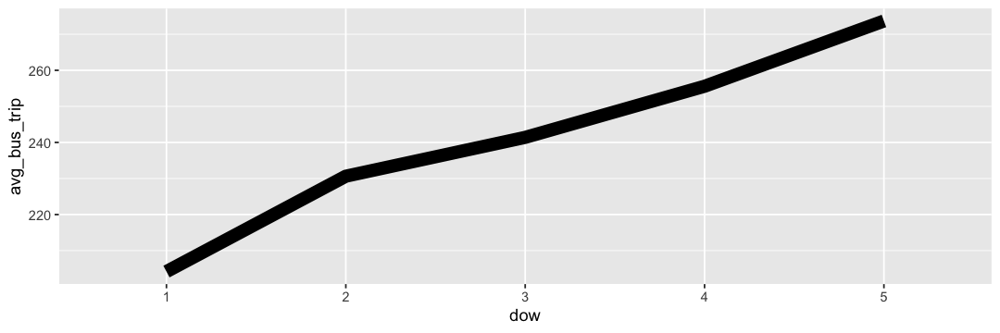

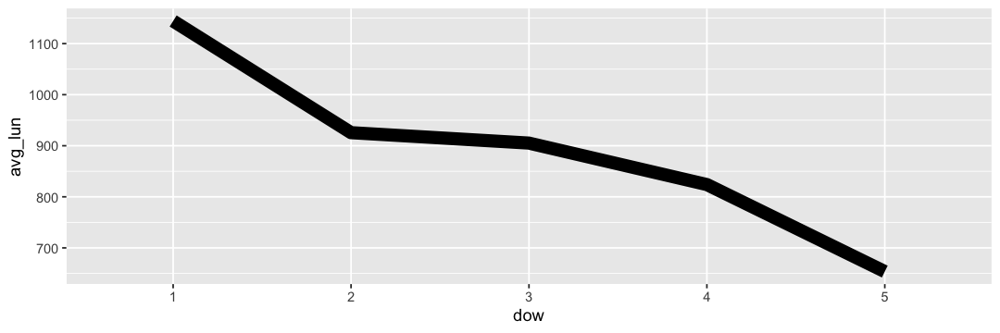

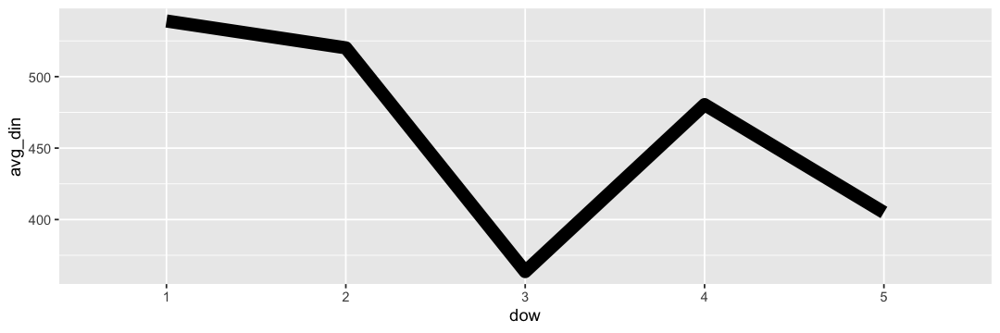

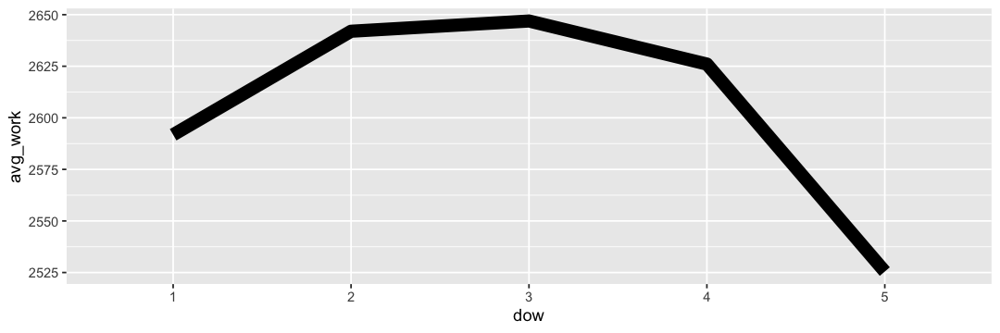

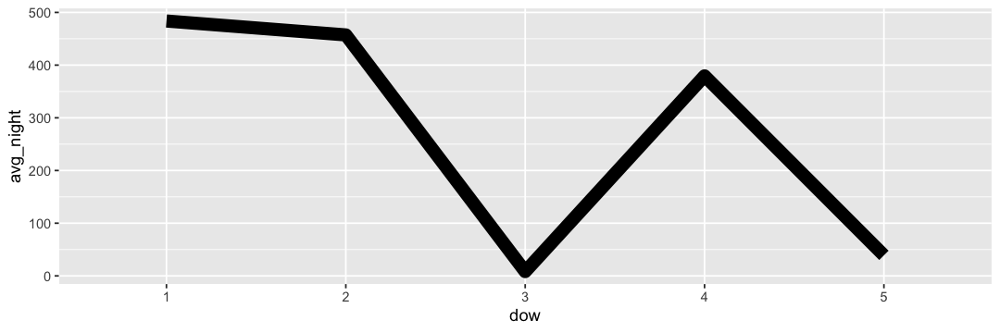

In [40]:
train%>%group_by(dow)%>%summarize(avg_all=mean(all))%>%
    ggplot(aes(x=dow,y=avg_all,group=1))+geom_line(size=4)+coord_cartesian(ylim = c(2750, 2850))
train%>%group_by(dow)%>%summarize(avg_vac=mean(vac))%>%
    ggplot(aes(x=dow,y=avg_vac,group=1))+geom_line(size=4)
train%>%group_by(dow)%>%summarize(avg_bus_trip=mean(bus_trip))%>%
    ggplot(aes(x=dow,y=avg_bus_trip,group=1))+geom_line(size=4)
train%>%group_by(dow)%>%summarize(avg_lun=mean(lun_num))%>%
    ggplot(aes(x=dow,y=avg_lun,group=1))+geom_line(size=4)
train%>%group_by(dow)%>%summarize(avg_din=mean(din_num))%>%
    ggplot(aes(x=dow,y=avg_din,group=1))+geom_line(size=4)
train%>%group_by(dow)%>%summarize(avg_work=mean(work))%>%
    ggplot(aes(x=dow,y=avg_work,group=1))+geom_line(size=4)
train%>%group_by(dow)%>%summarize(avg_night=mean(night))%>%
    ggplot(aes(x=dow,y=avg_night,group=1))+geom_line(size=4)

In [41]:
median(train$day)

[1] 16

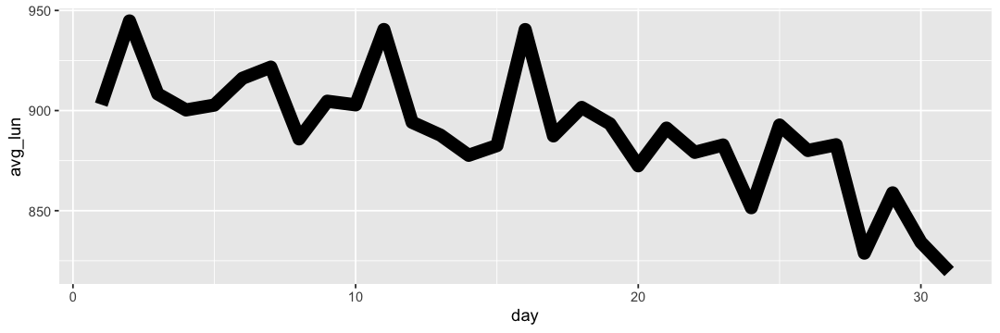

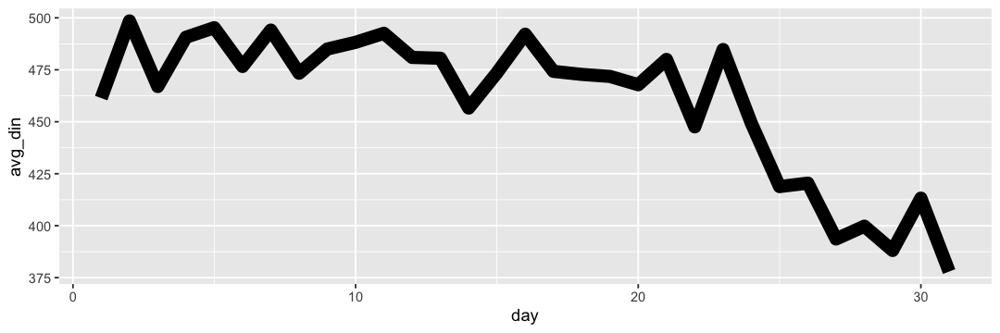

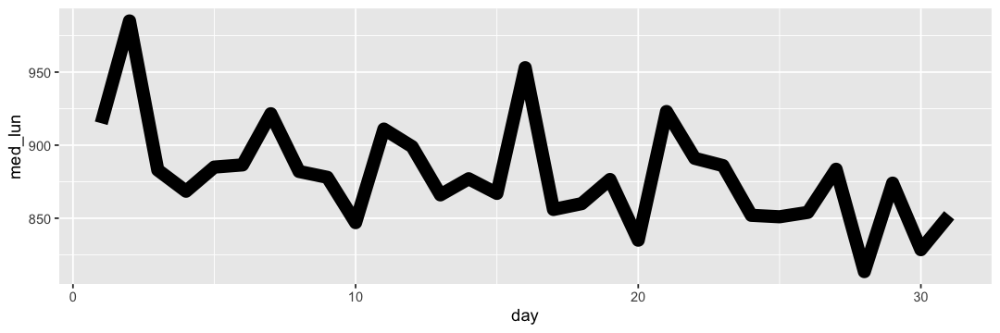

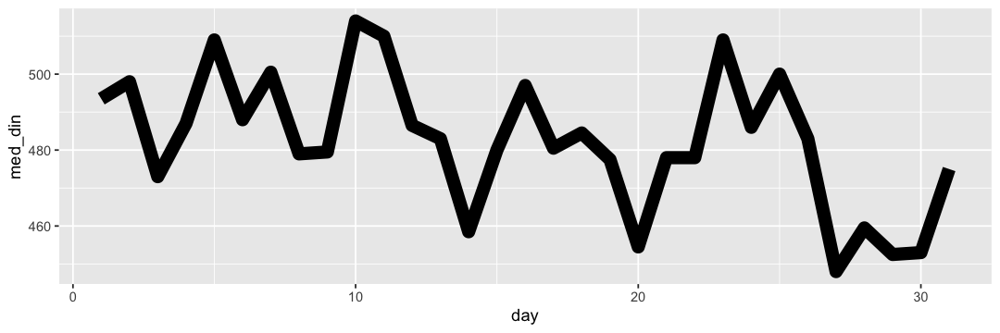

In [42]:
train%>%group_by(day)%>%summarize(avg_lun=mean(lun_num))%>%
    ggplot(aes(x=day,y=avg_lun,group=1))+geom_line(size=4)
train%>%group_by(day)%>%summarize(avg_din=mean(din_num))%>%
    ggplot(aes(x=day,y=avg_din,group=1))+geom_line(size=4)
train%>%group_by(day)%>%summarize(med_lun=median(lun_num))%>%
    ggplot(aes(x=day,y=med_lun,group=1))+geom_line(size=4)
train%>%group_by(day)%>%summarize(med_din=median(din_num))%>%
    ggplot(aes(x=day,y=med_din,group=1))+geom_line(size=4)

In [43]:
train%>%group_by(month)%>%summarize(avg_lun=mean(lun_num),med_din=median(lun_num))

month,avg_lun,med_din
<dbl>,<dbl>,<dbl>
1,934.2475,911.0
2,989.6237,984.0
3,953.6075,956.0
4,883.6214,855.0
5,869.7879,856.0
6,863.3111,875.0
7,848.7364,855.5
8,854.7850,842.0
9,907.1489,919.0


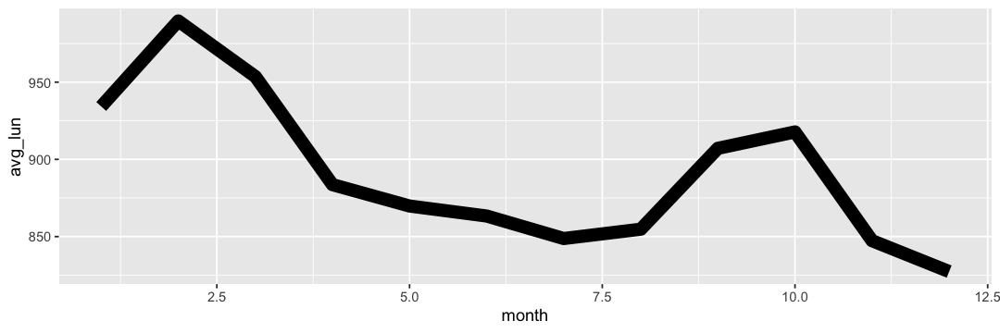

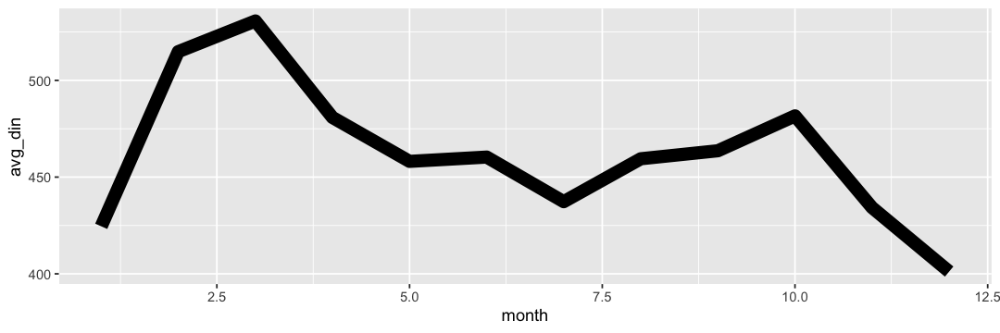

In [44]:
train%>%group_by(month)%>%summarize(avg_lun=mean(lun_num))%>%
    ggplot(aes(x=month,y=avg_lun,group=1))+geom_line(size=4)
train%>%group_by(month)%>%summarize(avg_din=mean(din_num))%>%
    ggplot(aes(x=month,y=avg_din,group=1))+geom_line(size=4)

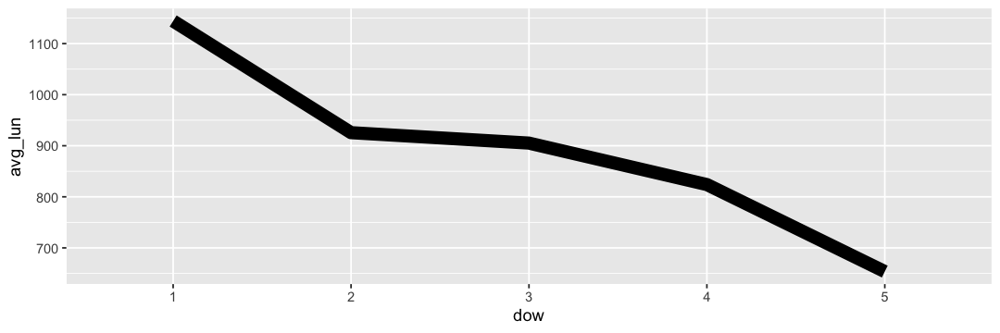

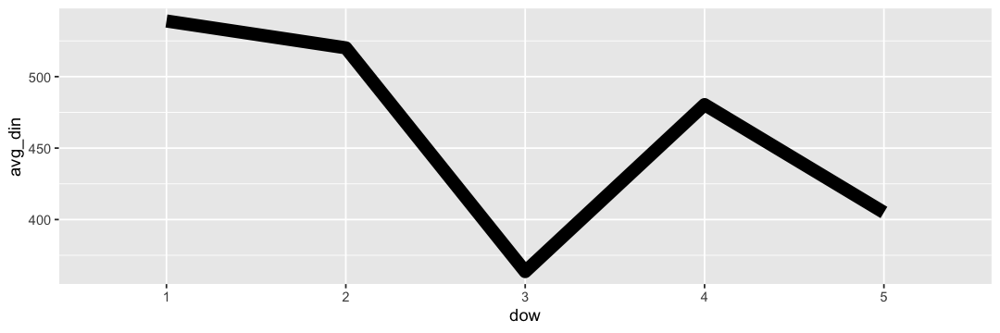

In [45]:
train%>%group_by(dow)%>%summarize(avg_lun=mean(lun_num))%>%
    ggplot(aes(x=dow,y=avg_lun,group=1))+geom_line(size=4)
train%>%group_by(dow)%>%summarize(avg_din=mean(din_num))%>%
    ggplot(aes(x=dow,y=avg_din,group=1))+geom_line(size=4)

In [126]:
options(repr.plot.width=20, repr.plot.height=3)

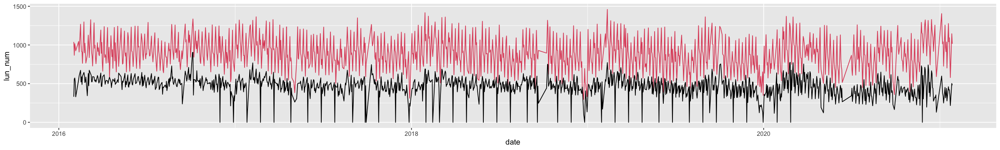

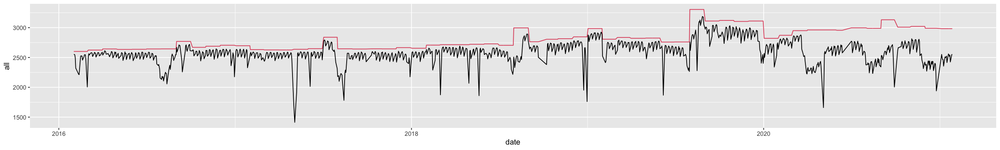

In [49]:
ggplot(data=train,aes(x=date,y=lun_num))+geom_line(col=2)+ geom_line(aes(y = din_num))
ggplot(data=train,aes(x=date,y=all))+geom_line(col=2)+ geom_line(aes(y = work))

In [124]:
mean(train[train$month==1 & train$year==2020 ,]$lun_num)

[1] 830.3

In [65]:
test

date,dow,all,vac,bus_trip,night,home,year,month,day,ym,work,work_rate,holi,covid,holiday,dow_din,mon_ln,mon_dn
<date>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<dbl>,<dbl>,<dbl>
2021-01-27,3,2983,88,182,5,358,2021,1,27,2021-01,2537,85.04861,0,Y,N,1,3,11
2021-01-28,4,2983,104,212,409,348,2021,1,28,2021-01,2531,84.84747,0,Y,N,3,3,11
2021-01-29,5,2983,270,249,0,294,2021,1,29,2021-01,2419,81.09286,0,Y,N,2,3,11
2021-02-01,1,2924,108,154,538,322,2021,2,1,2021-02,2494,85.29412,0,Y,N,5,1,2
2021-02-02,2,2924,62,186,455,314,2021,2,2,2021-02,2548,87.14090,0,Y,N,4,1,2
2021-02-03,3,2924,59,199,5,286,2021,2,3,2021-02,2579,88.20109,0,Y,N,1,1,2
2021-02-04,4,2924,61,211,476,288,2021,2,4,2021-02,2575,88.06430,0,Y,N,3,1,2
2021-02-05,5,2924,169,252,0,256,2021,2,5,2021-02,2499,85.46512,0,Y,N,2,1,2
2021-02-08,1,2924,88,174,690,329,2021,2,8,2021-02,2507,85.73871,0,Y,N,5,1,2


In [112]:
train[train$year==2021,]

,date,dow,all,vac,bus_trip,night,home,lun_num,din_num,year,month,day,ym,work,work_rate
,<date>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<dbl>,<dbl>
1189,2021-01-04,1,2983,92,91,490,340,1405,598,2021,1,4,2021-01,2551,85.51793
1190,2021-01-05,2,2983,99,156,500,390,1128,484,2021,1,5,2021-01,2494,83.60711
1191,2021-01-06,3,2983,85,156,11,433,1014,377,2021,1,6,2021-01,2465,82.63493
1192,2021-01-07,4,2983,98,182,413,421,1040,342,2021,1,7,2021-01,2464,82.60141
1193,2021-01-08,5,2983,255,218,0,373,726,250,2021,1,8,2021-01,2355,78.94737
1194,2021-01-11,1,2983,105,158,517,369,1257,451,2021,1,11,2021-01,2509,84.10996
1195,2021-01-12,2,2983,83,168,433,404,963,317,2021,1,12,2021-01,2496,83.67415
1196,2021-01-13,3,2983,80,175,8,393,913,360,2021,1,13,2021-01,2510,84.14348
1197,2021-01-14,4,2983,90,205,428,370,1038,439,2021,1,14,2021-01,2523,84.57928


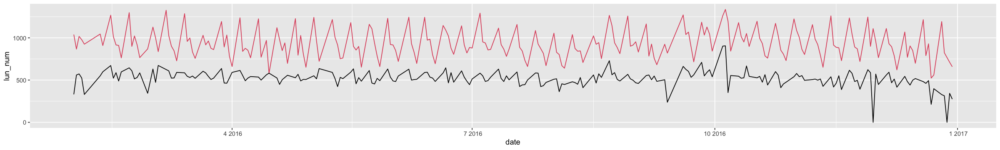

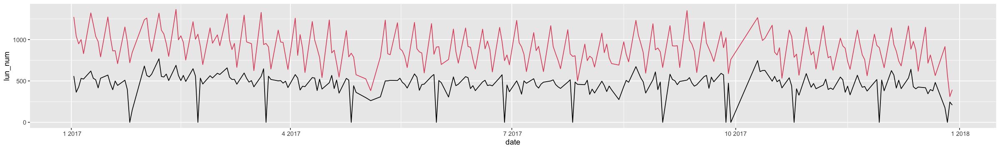

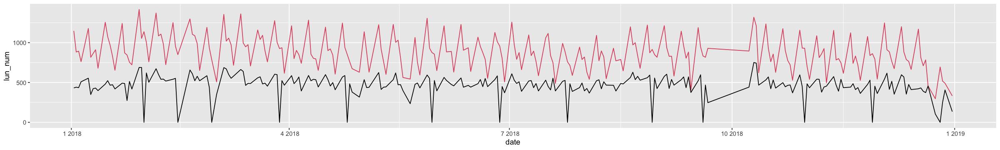

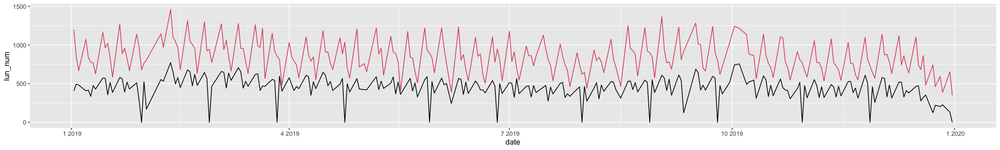

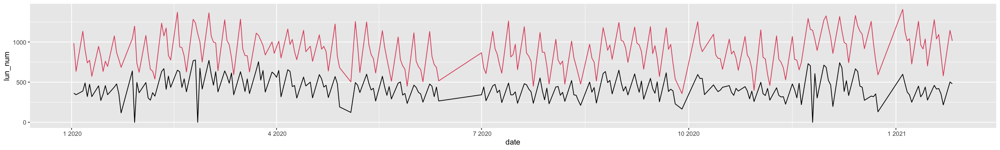

In [127]:
ggplot(data=train[train$year==2016,],aes(x=date,y=lun_num))+geom_line(col=2)+ geom_line(aes(y = din_num))
ggplot(data=train[train$year==2017,],aes(x=date,y=lun_num))+geom_line(col=2)+ geom_line(aes(y = din_num))
ggplot(data=train[train$year==2018,],aes(x=date,y=lun_num))+geom_line(col=2)+ geom_line(aes(y = din_num))
ggplot(data=train[train$year==2019,],aes(x=date,y=lun_num))+geom_line(col=2)+ geom_line(aes(y = din_num))
ggplot(data=train[train$year>=2020,],aes(x=date,y=lun_num))+geom_line(col=2)+ geom_line(aes(y = din_num))


In [52]:
train[train$year==2020,]

,date,dow,all,vac,bus_trip,night,home,lun_num,din_num,year,⋯,day,ym,work,work_rate,holi,covid,holiday,dow_din,mon_ln,mon_dn
,<date>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<int>,<chr>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<dbl>,<dbl>,<dbl>
957,2020-01-02,4,2821,255,133,338,0,985,362,2020,⋯,2,2020-01,2566,90.96065,0,Y,N,3,3,11
958,2020-01-03,5,2821,321,186,3,0,635,344,2020,⋯,3,2020-01,2500,88.62106,0,Y,N,2,3,11
959,2020-01-06,1,2821,119,203,424,5,1133,389,2020,⋯,6,2020-01,2697,95.60440,0,Y,N,5,3,11
960,2020-01-07,2,2821,95,204,448,7,904,490,2020,⋯,7,2020-01,2719,96.38426,0,Y,N,4,3,11
961,2020-01-08,3,2821,117,222,7,5,740,321,2020,⋯,8,2020-01,2699,95.67529,0,Y,N,1,3,11
962,2020-01-09,4,2821,124,241,426,7,773,474,2020,⋯,9,2020-01,2690,95.35626,0,Y,N,3,3,11
963,2020-01-10,5,2821,264,262,0,3,573,320,2020,⋯,10,2020-01,2554,90.53527,0,Y,N,2,3,11
964,2020-01-13,1,2821,141,218,526,0,945,454,2020,⋯,13,2020-01,2680,95.00177,0,Y,N,5,3,11
965,2020-01-14,2,2821,96,236,388,0,820,272,2020,⋯,14,2020-01,2725,96.59695,0,Y,N,4,3,11


In [45]:
options(repr.plot.width=6, repr.plot.height=6)

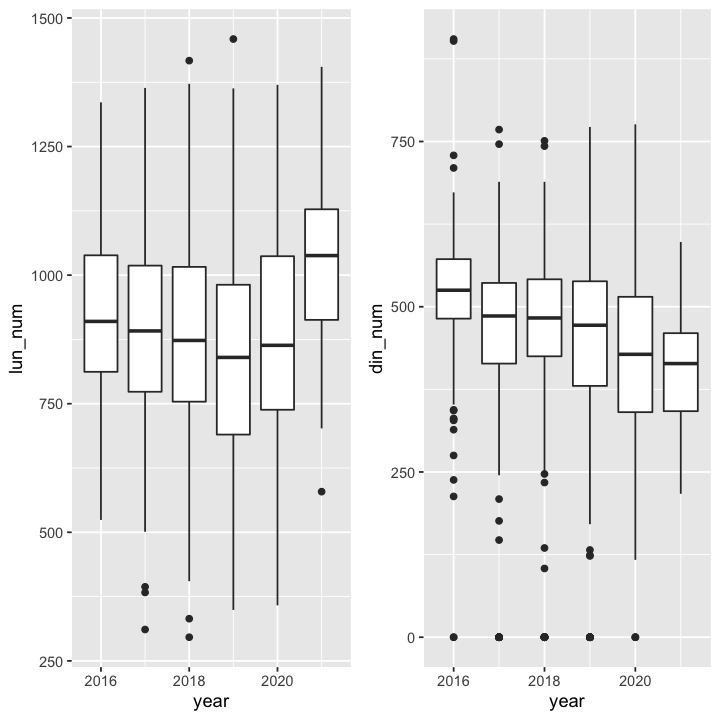

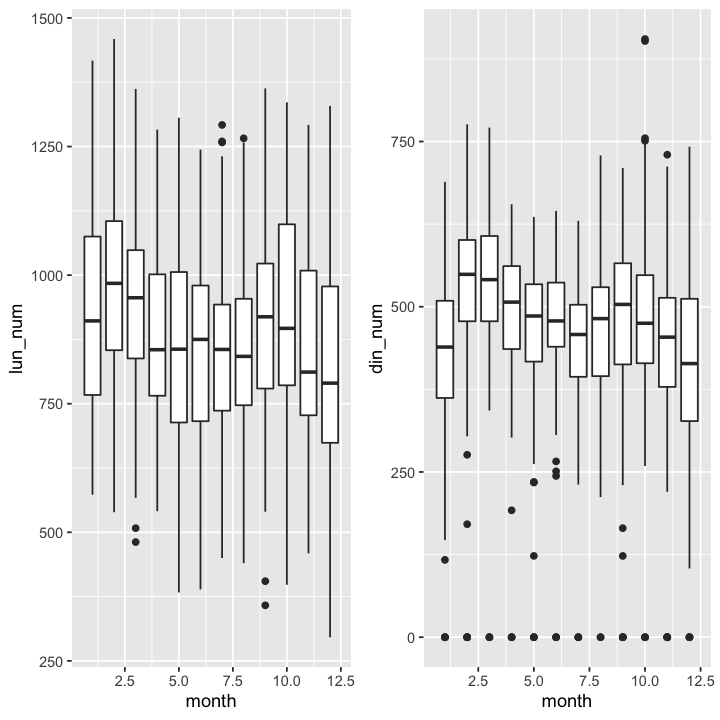

In [46]:
a = ggplot(train, aes(year, lun_num,group=year))+geom_boxplot()
b = ggplot(train, aes(year, din_num,group=year))+geom_boxplot()
c = ggplot(train, aes(month, lun_num,group=month))+geom_boxplot()
d = ggplot(train, aes(month, din_num,group=month))+geom_boxplot()
ggarrange(a,b)
ggarrange(c,d)

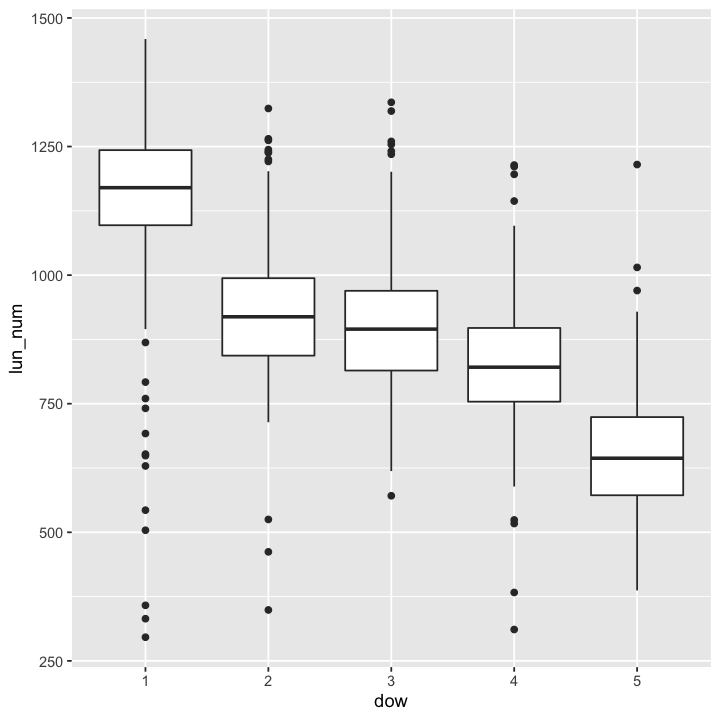

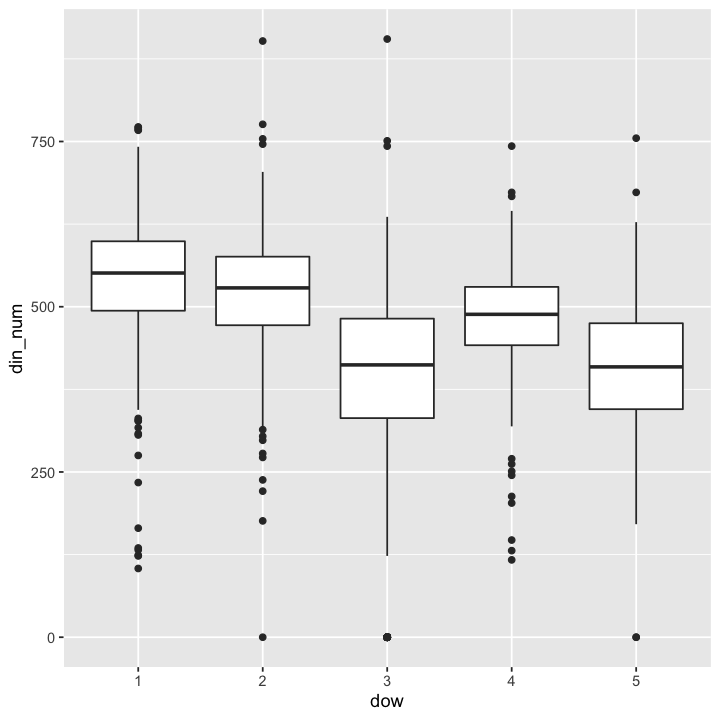

In [47]:
ggplot(train, aes(dow, lun_num,group=dow))+geom_boxplot()
ggplot(train, aes(dow, din_num,group=dow))+geom_boxplot()

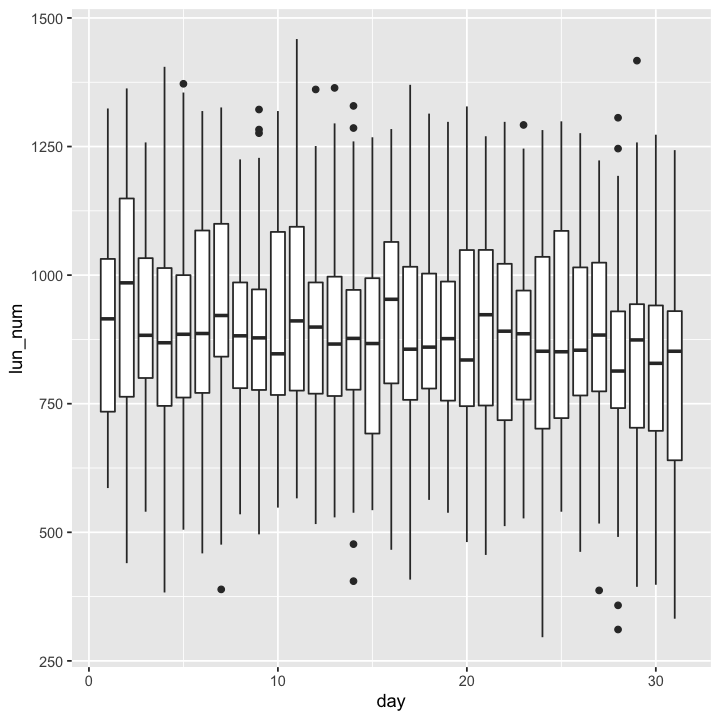

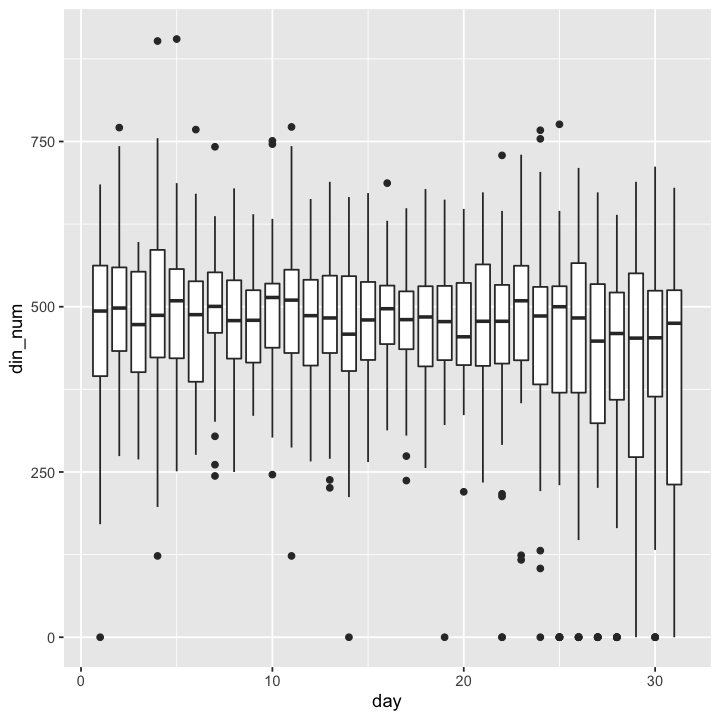

In [48]:
ggplot(train, aes(day, lun_num,group=day))+geom_boxplot()
ggplot(train, aes(day, din_num,group=day))+geom_boxplot()

In [49]:
colnames(train)

[1] "date"      "dow"       "all"       "vac"       "bus_trip"  "night"    
 [7] "home"      "lun_num"   "din_num"   "year"      "month"     "day"      
[13] "ym"        "work"      "work_rate" "holi"      "covid"     "holiday"  
[19] "dow_din"   "mon_ln"    "mon_dn"

In [50]:
train%>%group_by(month)%>%summarize(lunch=mean(lun_num),dinner=mean(din_num))

month,lunch,dinner
<dbl>,<dbl>,<dbl>
1,934.2475,424.5644
2,989.6237,514.8602
3,953.6075,530.7009
4,883.6214,480.8252
5,869.7879,458.1313
6,863.3111,460.3556
7,848.7364,437.3000
8,854.7850,459.4860
9,907.1489,463.6170


2월,3월,1월,10월

In [51]:
write.csv(train,"/Users/gimdong-wan/Desktop/공모전/DACON/구내식당 식수인원 예측/train.csv")
write.csv(test,"/Users/gimdong-wan/Desktop/공모전/DACON/구내식당 식수인원 예측/test.csv")

In [52]:
train%>%head(3)

,date,dow,all,vac,bus_trip,night,home,lun_num,din_num,year,⋯,day,ym,work,work_rate,holi,covid,holiday,dow_din,mon_ln,mon_dn
,<date>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<int>,<chr>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<dbl>,<dbl>,<dbl>
1,2016-02-01,1,2601,50,150,238,0,1039,331,2016,⋯,1,2016-02,2551,98.07766,0,N,N,5,1,2
2,2016-02-02,2,2601,50,173,319,0,867,560,2016,⋯,2,2016-02,2551,98.07766,0,N,N,4,1,2
3,2016-02-03,3,2601,56,180,111,0,1017,573,2016,⋯,3,2016-02,2545,97.84698,0,N,N,1,1,2


In [53]:
a_test = test%>%mutate('lun_num' = 0, 'din_num' = 0)

In [54]:
all = rbind(train,a_test)
week = week(all$date)

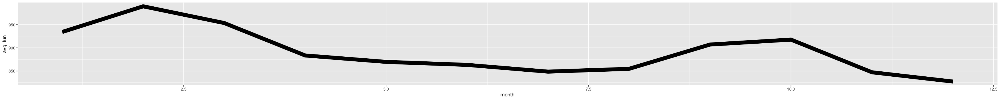

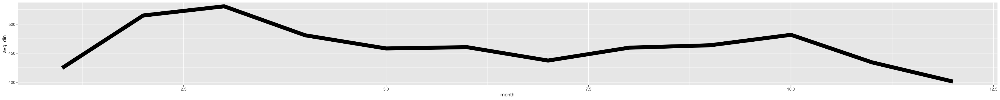

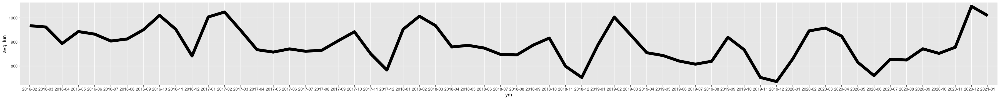

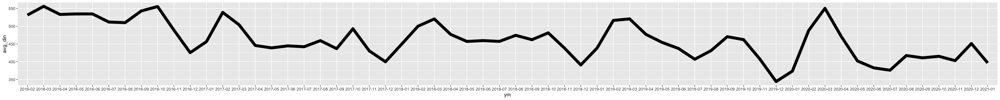

In [55]:
options(repr.plot.width=30, repr.plot.height=3)
train%>%group_by(month)%>%summarize(avg_lun=mean(lun_num))%>%
    ggplot(aes(x=month,y=avg_lun,group=1))+geom_line(size=4)
train%>%group_by(month)%>%summarize(avg_din=mean(din_num))%>%
    ggplot(aes(x=month,y=avg_din,group=1))+geom_line(size=4)
train%>%group_by(ym)%>%summarize(avg_lun=mean(lun_num))%>%
    ggplot(aes(x=ym,y=avg_lun,group=1))+geom_line(size=3)
train%>%group_by(ym)%>%summarize(avg_din=mean(din_num))%>%
    ggplot(aes(x=ym,y=avg_din,group=1))+geom_line(size=3)

In [56]:
colnames(train)

[1] "date"      "dow"       "all"       "vac"       "bus_trip"  "night"    
 [7] "home"      "lun_num"   "din_num"   "year"      "month"     "day"      
[13] "ym"        "work"      "work_rate" "holi"      "covid"     "holiday"  
[19] "dow_din"   "mon_ln"    "mon_dn"

In [57]:
train = train%>%mutate(ln_vac = log(vac))

In [58]:
options(repr.plot.width=5, repr.plot.height=5)
par(mfrow=c(2,2))

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



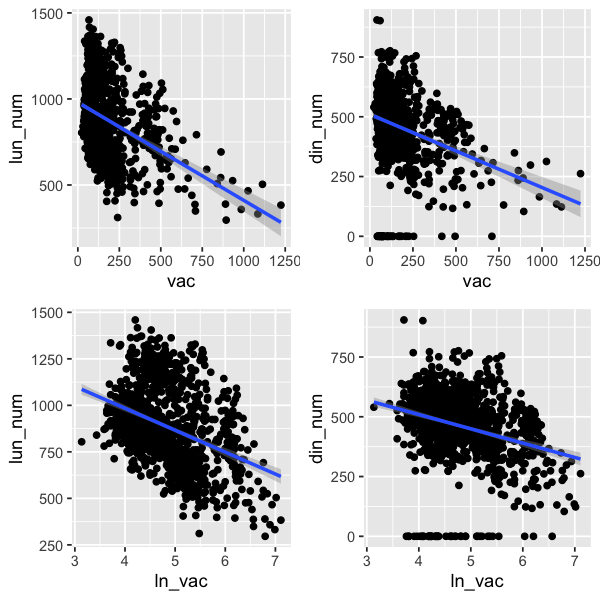

In [59]:
a<-ggplot(train, aes(x=vac, y=lun_num))+geom_point()+stat_smooth(method=lm) 
b<-ggplot(train, aes(x=vac, y=din_num))+geom_point()+stat_smooth(method=lm) 
c<-ggplot(train, aes(x=ln_vac, y=lun_num))+geom_point()+stat_smooth(method=lm) 
d<-ggplot(train, aes(x=ln_vac, y=din_num))+geom_point()+stat_smooth(method=lm) 
ggarrange(a,b,c,d)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



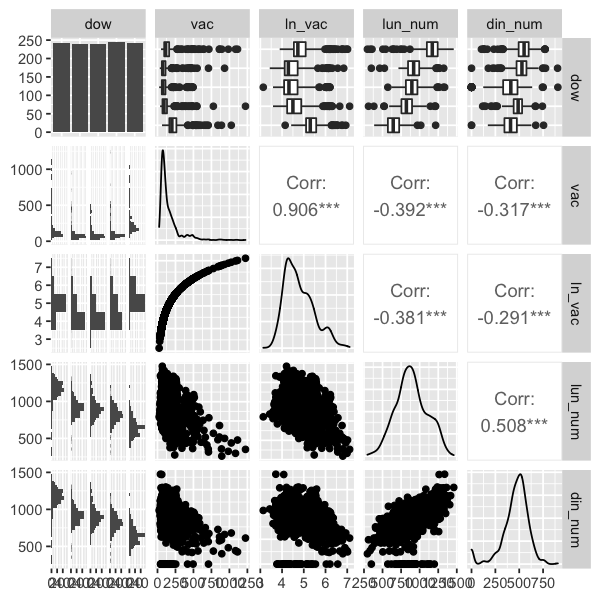

In [60]:
gg<- ggpairs(data = train , columns = c('dow','vac','ln_vac','lun_num','din_num'))

gg[2,1] <- gg[2,1] + geom_histogram(binwidth = 30)
gg[3,1] <- gg[3,1] + geom_histogram(binwidth = 1)
gg[4,1] <- gg[4,1] + geom_histogram(binwidth = 50)
gg[5,1] <- gg[4,1] + geom_histogram(binwidth = 50)


gg

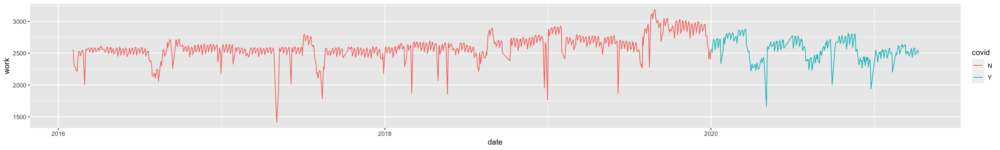

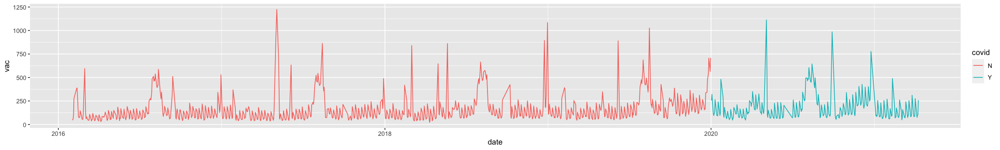

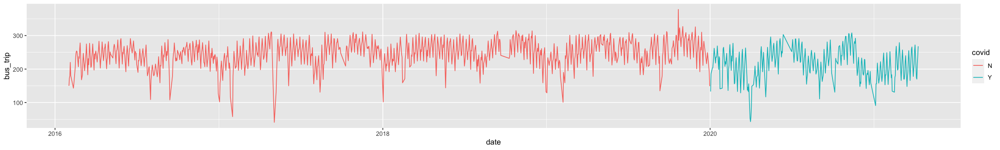

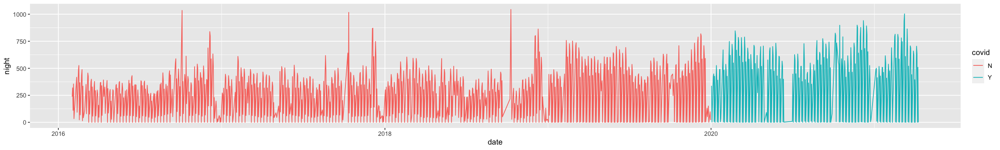

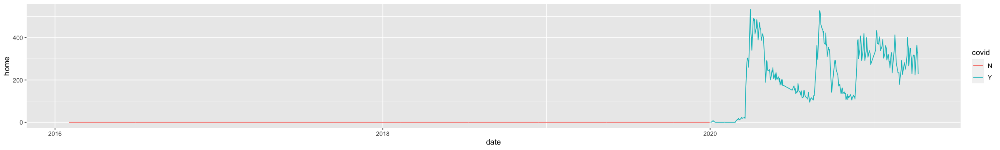

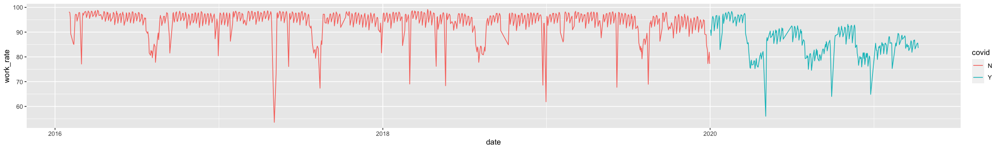

In [61]:
options(repr.plot.width=20, repr.plot.height=3)

ggplot(data=all,aes(x=date,y=work,color=covid))+geom_line()
ggplot(data=all,aes(x=date,y=vac,color = covid))+geom_line()
ggplot(data=all,aes(x=date,y=bus_trip,color = covid))+geom_line()
ggplot(data=all,aes(x=date,y=night,color = covid))+geom_line()
ggplot(data=all,aes(x=date,y=home,color = covid))+geom_line()
ggplot(data=all,aes(x=date,y=work_rate,color = covid))+geom_line()

In [62]:
colnames(train)

[1] "date"      "dow"       "all"       "vac"       "bus_trip"  "night"    
 [7] "home"      "lun_num"   "din_num"   "year"      "month"     "day"      
[13] "ym"        "work"      "work_rate" "holi"      "covid"     "holiday"  
[19] "dow_din"   "mon_ln"    "mon_dn"    "ln_vac"

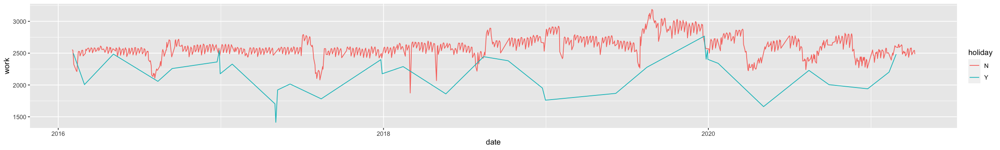

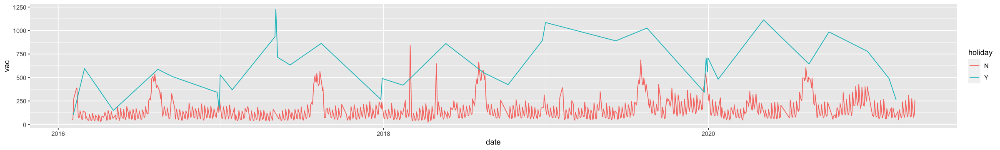

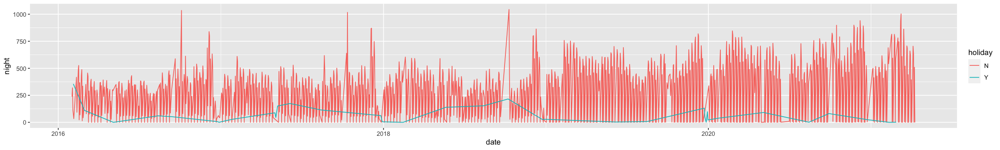

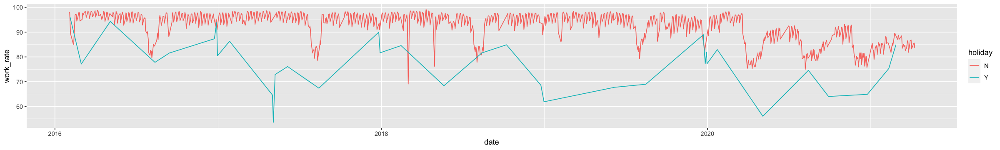

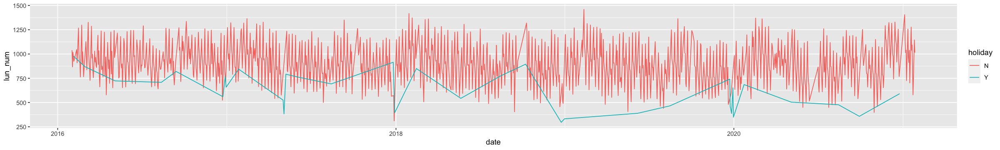

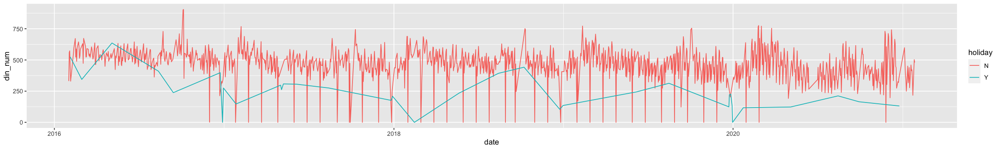

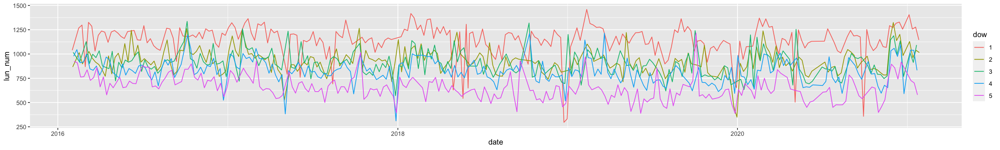

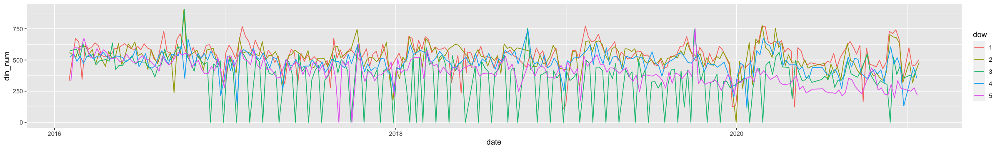

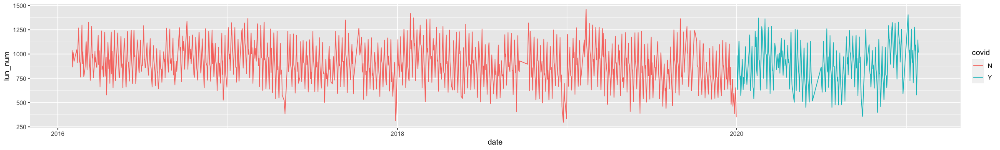

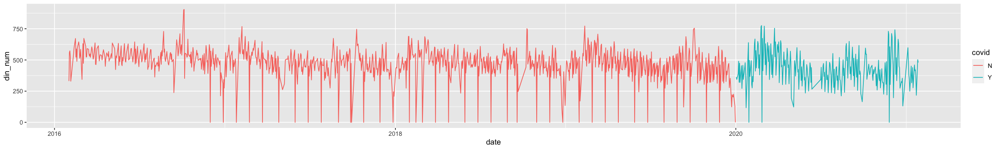

In [63]:
ggplot(data=all,aes(x=date,y=work,color=holiday))+geom_line()
ggplot(data=all,aes(x=date,y=vac,color = holiday))+geom_line()
ggplot(data=all,aes(x=date,y=night,color = holiday))+geom_line()
ggplot(data=all,aes(x=date,y=work_rate,color = holiday))+geom_line()
ggplot(data=train,aes(x=date,y=lun_num,color = holiday))+geom_line()
ggplot(data=train,aes(x=date,y=din_num,color = holiday))+geom_line()
ggplot(data=train,aes(x=date,y=lun_num,color = dow))+geom_line()
ggplot(data=train,aes(x=date,y=din_num,color = dow))+geom_line()
ggplot(data=train,aes(x=date,y=lun_num,color = covid))+geom_line()
ggplot(data=train,aes(x=date,y=din_num,color = covid))+geom_line()

In [64]:
library(car)

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:purrr’:

    some


The following object is masked from ‘package:dplyr’:

    recode




둘다 등분산 가정

In [65]:
leveneTest(lun_num ~ covid , data = train)
leveneTest(din_num ~ covid , data = train)

,Df,F value,Pr(>F)
,<int>,<dbl>,<dbl>
group,1,4.69137,0.0305104
,1203,NA,NA


,Df,F value,Pr(>F)
,<int>,<dbl>,<dbl>
group,1,6.324388,0.01203842
,1203,NA,NA


In [66]:
t.test(lun_num ~ covid , data = train,var.equal = FALSE)
t.test(din_num ~ covid , data = train,var.equal = FALSE)


	Welch Two Sample t-test

data:  lun_num by covid
t = -0.051365, df = 367.94, p-value = 0.9591
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -31.36463  29.76780
sample estimates:
mean in group N mean in group Y 
       890.1695        890.9679 



	Welch Two Sample t-test

data:  din_num by covid
t = 4.2269, df = 380.42, p-value = 2.97e-05
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 22.53696 61.74056
sample estimates:
mean in group N mean in group Y 
       470.4801        428.3414 


In [67]:
train%>%group_by(month)%>%summarize(lunch=mean(lun_num),dinner=mean(din_num))

month,lunch,dinner
<dbl>,<dbl>,<dbl>
1,934.2475,424.5644
2,989.6237,514.8602
3,953.6075,530.7009
4,883.6214,480.8252
5,869.7879,458.1313
6,863.3111,460.3556
7,848.7364,437.3000
8,854.7850,459.4860
9,907.1489,463.6170


In [68]:
leveneTest(lun_num ~ holiday , data = train)
leveneTest(din_num ~ holiday , data = train)

,Df,F value,Pr(>F)
,<int>,<dbl>,<dbl>
group,1,0.08323194,0.7730141
,1203,NA,NA


,Df,F value,Pr(>F)
,<int>,<dbl>,<dbl>
group,1,0.7467112,0.3876918
,1203,NA,NA


In [69]:
t.test(lun_num ~ holiday , data = train,var.equal = TRUE)
t.test(din_num ~ holiday , data = train,var.equal = TRUE)


	Two Sample t-test

data:  lun_num by holiday
t = 7.7698, df = 1203, p-value = 1.676e-14
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 206.6508 346.2662
sample estimates:
mean in group N mean in group Y 
       898.1349        621.6765 



	Two Sample t-test

data:  din_num by holiday
t = 9.8412, df = 1203, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 183.6121 275.0512
sample estimates:
mean in group N mean in group Y 
       468.2434        238.9118 


write.csv(train,"/Users/gimdong-wan/Desktop/공모전/DACON/구내식당 식수인원 예측/train.csv")
write.csv(test,"/Users/gimdong-wan/Desktop/공모전/DACON/구내식당 식수인원 예측/test.csv")

In [70]:
train%>%group_by(holiday)%>%summarize(lunch=mean(lun_num),dinner=mean(din_num))

holiday,lunch,dinner
<fct>,<dbl>,<dbl>
N,898.1349,468.2434
Y,621.6765,238.9118


In [71]:
train_x <- train[train$din_num!=0,]

In [72]:
train%>%group_by(dow)%>%summarize('lunch'=mean(lun_num),'dinner'=mean(din_num))

dow,lunch,dinner
<chr>,<dbl>,<dbl>
1,1144.3320,538.9336
2,925.6208,520.1292
3,905.2134,363.6151
4,823.9918,480.4016
5,653.6100,404.9793


In [73]:
train_x%>%group_by(dow)%>%summarize('lunch'=mean(lun_num),'dinner'=mean(din_num))

dow,lunch,dinner
<chr>,<dbl>,<dbl>
1,1144.3320,538.9336
2,928.0335,522.3054
3,910.3317,436.7035
4,823.9918,480.4016
5,653.1255,408.3682


2016/02/04 -> 2016-02-05 [4>5]  
2016/12/26 -> 2016/12/22, 23 [223 -> 220,221]  
2016/12/28  -> +226  

In [74]:
options(repr.plot.width=9, repr.plot.height=9)

In [75]:
model.1 = lm(lun_num ~ 1, data = train)
model.2 = lm(din_num ~ 1, data = train)

In [76]:
colnames(train)

[1] "date"      "dow"       "all"       "vac"       "bus_trip"  "night"    
 [7] "home"      "lun_num"   "din_num"   "year"      "month"     "day"      
[13] "ym"        "work"      "work_rate" "holi"      "covid"     "holiday"  
[19] "dow_din"   "mon_ln"    "mon_dn"    "ln_vac"

In [77]:
skim(train)

─ Data Summary ────────────
                           Values
Name                       train 
Number of rows             1205  
Number of columns          22    
_______________________          
Column type frequency:           
  character                2     
  Date                     1     
  factor                   2     
  numeric                  17    
________________________         
Group variables            None  

─ Variable type: character ──────────────────────────
  skim_variable n_missing complete_rate   min   max empty n_unique whitespace
1 dow                   0             1     1     1     0        5          0
2 ym                    0             1     7     7     0       60          0

─ Variable type: Date ─────────────────────────────
  skim_variable n_missing complete_rate min        max        median    
1 date                  0             1 2016-02-01 2021-01-26 2018-07-16
  n_unique
1     1205

─ Variable type: factor ────────────────────────────


In [78]:
tep.forward = stepAIC(model.1,                             # 절편만 있는 모형에서 시작
                       direction = "both",               # 전진 방식
                       scope=lun_num~vac+bus_trip+night+work_rate+dow+mon_ln)

Start:  AIC=12881.84
lun_num ~ 1

            Df Sum of Sq      RSS   AIC
+ dow        4  30478995 22367417 11854
+ night      1  15160541 37685871 12476
+ bus_trip   1  13890197 38956215 12516
+ vac        1   8119558 44726854 12683
+ work_rate  1   3677112 49169300 12797
+ mon_ln     1   2520153 50326259 12825
<none>                   52846412 12882

Step:  AIC=11853.8
lun_num ~ dow

            Df Sum of Sq      RSS   AIC
+ vac        1   4650388 17717030 11575
+ night      1   3079142 19288275 11677
+ mon_ln     1   2390474 19976943 11720
+ work_rate  1   1921506 20445911 11748
+ bus_trip   1    873605 21493813 11808
<none>                   22367417 11854
- dow        4  30478995 52846412 12882

Step:  AIC=11574.94
lun_num ~ dow + vac

            Df Sum of Sq      RSS   AIC
+ bus_trip   1   4360381 13356649 11236
+ night      1   1379575 16337455 11479
+ mon_ln     1   1007776 16709253 11506
+ work_rate  1    409235 17307795 11549
<none>                   17717030 11575
- vac    

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



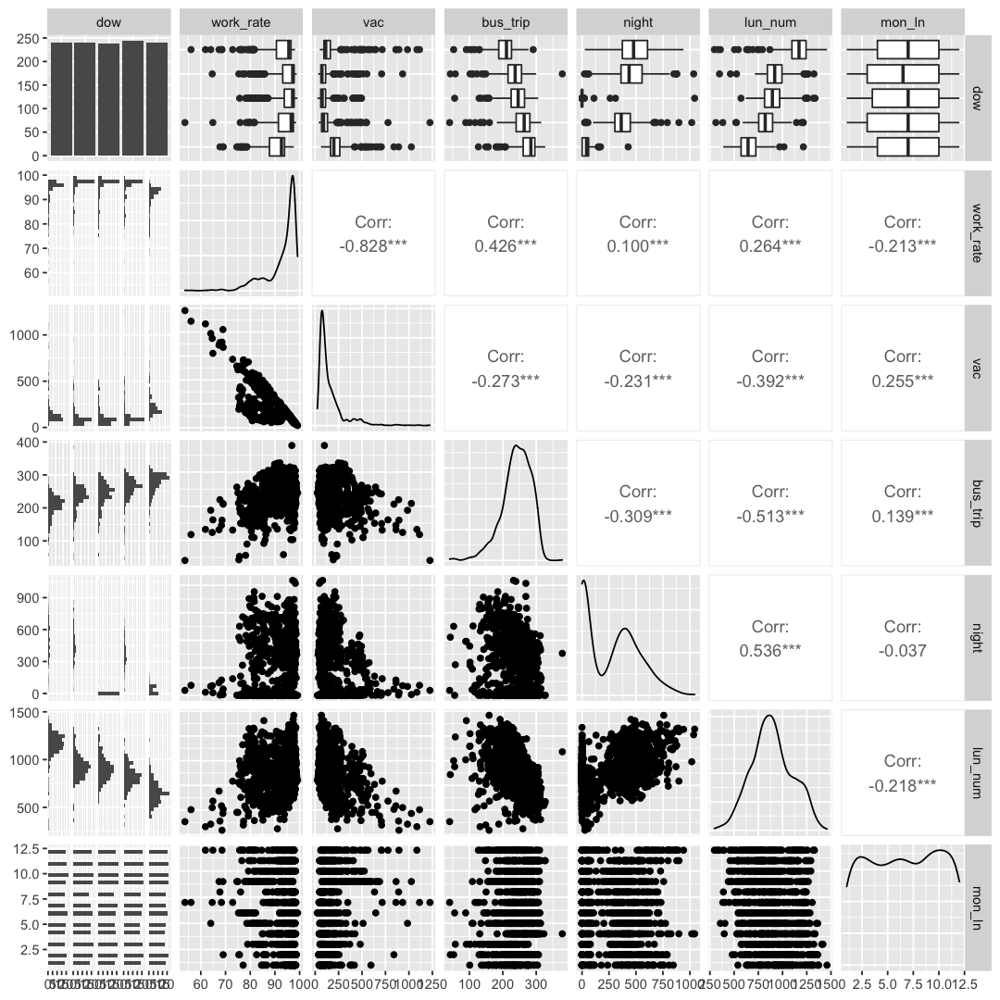

In [79]:
gg<- ggpairs(data = train , columns = c('dow','work_rate','vac','bus_trip','night','lun_num','mon_ln'))

gg

In [80]:
library(caret)

Loading required package: lattice


Attaching package: ‘caret’


The following objects are masked from ‘package:yardstick’:

    precision, recall, sensitivity, specificity


The following object is masked from ‘package:purrr’:

    lift




In [81]:
vif(model1)

ERROR: Error in vif(model1): 객체 'model1'를 찾을 수 없습니다


In [3]:
model1 = lm(lun_num~vac+bus_trip+night+work_rate,data=train)
summary(model1)

ERROR: Error in eval(predvars, data, env): 객체 'lun_num'를 찾을 수 없습니다


In [4]:
colnames(train)

[1] "일자"                         "요일"                        
 [3] "본사정원수"                   "본사휴가자수"                
 [5] "본사출장자수"                 "본사시간외근무명령서승인건수"
 [7] "현본사소속재택근무자수"       "조식메뉴"                    
 [9] "중식메뉴"                     "석식메뉴"                    
[11] "중식계"                       "석식계"

In [5]:
tep.forward = stepAIC(model.1,                             # 절편만 있는 모형에서 시작
                       direction = "both",               # 전진 방식
                       scope=lun_num~dow+bus_trip+night+work_rate)

ERROR: Error in terms(object): 객체 'model.1'를 찾을 수 없습니다


In [ ]:
model1 = lm(lun_num~night+work_rate:bus_trip+work_rate,data=train)
summary(model1)

In [ ]:
tep.forward = stepAIC(model.1,                             # 절편만 있는 모형에서 시작
                       direction = "both",               # 전진 방식
                       scope=lun_num~night+work_rate:bus_trip+work_rate)

In [ ]:
tep.forward = stepAIC(model.2,                             # 절편만 있는 모형에서 시작
                       direction = "both",               # 전진 방식
                       scope=din_num~night+vac+home+work+bus_trip)

In [ ]:
model2 = lm(din_num~night+vac+home+home:bus_trip+bus_trip+work:bus_trip,data = train)

In [ ]:
summary(model2)

In [ ]:
tep.forward = stepAIC(model.2,                             # 절편만 있는 모형에서 시작
                       direction = "both",               # 전진 방식
                       scope=din_num~night+vac+home+home:bus_trip+bus_trip+work:bus_trip)

In [58]:
train_data<-oh_train[,2:(ncol(oh_train)-1)]
x_train_cv<-data.matrix(train_data)
y_train_cv<-data.matrix(oh_train$credit)

ERROR: Error in eval(expr, envir, enclos): 객체 'oh_train'를 찾을 수 없습니다


In [ ]:
train[,c(2,4,5,6,7,8)]

In [ ]:
ln_train = data.frame(train$dow,train$night,train$bus_trip,train$vac,train$home,train$lun_num)

In [ ]:
ln_test = data.frame(test$dow,test$night,test$bus_trip,test$vac,test$home)

In [ ]:
nrow(ln_train)

In [ ]:
hyper_grid <- expand.grid(max_depth = seq(3, 6, 1), eta = seq(.2, .35, .01))  

In [ ]:
x_train<- model.matrix(~.-1, data = ln_train[,-6]) %>% data.frame
x_test <- model.matrix(~.-1, data = ln_test[,-6]) %>% data.frame

dtrain <- xgb.DMatrix(data = as.matrix(x_train))
dtest <- xgb.DMatrix(data = as.matrix(x_test))

In [ ]:
set.seed(2020)
param <- list(objective   = "reg:squarederror",
              eval_metric = "error",
              max_depth   = 5,
              eta         = 0.01,
              subsample = 0.8,
              min_child_weight = 1)

xgb <- xgb.train(params  = param,
                 data    = dtrain,
                 nrounds = 500,
                 print_every_n = 1,
                 verbose = 0)

xgb_cv<-xgb.cv(data=dtrain,label=y_train_cv,
               nfold=5,nrounds=1000,early_stopping_rounds = 10,
               objective='multi:softprob',metrics='mlogloss',num_class=3,prediction = T,print_every_n = 10,
               params=list(eta=0.05,max_depth=8,subsample=0.8,colsample_bytree=0.8,stratified=T)) 

In [214]:
xgb_cv<-xgb.cv(data=data.matrix(ln_train[,-6]),label=data.matrix(ln_train[, 6]),
               nfold=5,nrounds=1000,early_stopping_rounds = 10,
               objective='reg:squarederror',num_class=3,
               params=list(eta=0.05,max_depth=8,subsample=0.8,colsample_bytree=0.8)) 

ERROR: Error in xgb.iter.update(fd$bst, fd$dtrain, iteration - 1, obj): [10:59:17] amalgamation/../src/objective/regression_obj.cu:58: Check failed: preds.Size() == info.labels_.Size() (2892 vs. 964) :  labels are not correctly providedpreds.size=2892, label.size=964, Loss: reg:squarederror
Stack trace:
  [bt] (0) 1   xgboost.so                          0x00000001081d7ea4 dmlc::LogMessageFatal::~LogMessageFatal() + 116
  [bt] (1) 2   xgboost.so                          0x00000001082b52c4 xgboost::obj::RegLossObj<xgboost::obj::LinearSquareLoss>::GetGradient(xgboost::HostDeviceVector<float> const&, xgboost::MetaInfo const&, int, xgboost::HostDeviceVector<xgboost::detail::GradientPairInternal<float> >*) + 468
  [bt] (2) 3   xgboost.so                          0x000000010827b5c6 xgboost::LearnerImpl::UpdateOneIter(int, std::__1::shared_ptr<xgboost::DMatrix>) + 806
  [bt] (3) 4   xgboost.so                          0x000000010825580c XGBoosterUpdateOneIter + 140
  [bt] (4) 5   xgboost.so                          0x00000001081d4e83 XGBoosterUpdateOneIter_R + 67


In [195]:
for (j in 1:nrow(hyper_grid)) {
  set.seed(123)
  m_xgb_untuned <- xgb.cv(
    data = data.matrix(ln_train[,-6]),
    label = data.matrix(ln_train[, 6]),
    nrounds = 1000,
    objective = "reg:squarederror",
    early_stopping_rounds = 3,
    nfold = 5,
    max_depth = hyper_grid$max_depth[j],
    eta = hyper_grid$eta[j]
  )
  
  xgb_train_rmse[j] <- m_xgb_untuned$evaluation_log$train_rmse_mean[m_xgb_untuned$best_iteration]
  xgb_test_rmse[j] <- m_xgb_untuned$evaluation_log$test_rmse_mean[m_xgb_untuned$best_iteration]
  
  cat(j, "\n")
}

[1]	train-rmse:735.794031+1.943666	test-rmse:735.891211+8.605345 
Multiple eval metrics are present. Will use test_rmse for early stopping.
Will train until test_rmse hasn't improved in 3 rounds.

[2]	train-rmse:593.574036+1.542050	test-rmse:594.291772+7.281177 
[3]	train-rmse:480.051721+1.467514	test-rmse:481.753644+6.695366 
[4]	train-rmse:389.744483+1.151105	test-rmse:391.756384+6.084436 
[5]	train-rmse:318.036932+0.892443	test-rmse:320.570728+5.269602 
[6]	train-rmse:261.650958+0.798400	test-rmse:264.551831+4.344522 
[7]	train-rmse:217.471961+0.858575	test-rmse:221.194144+3.796281 
[8]	train-rmse:183.399698+0.809066	test-rmse:187.752356+3.521699 
[9]	train-rmse:157.271146+0.886558	test-rmse:162.841702+3.223729 
[10]	train-rmse:137.638043+0.831462	test-rmse:144.075351+2.974585 
[11]	train-rmse:123.063103+0.850906	test-rmse:130.494592+3.072150 
[12]	train-rmse:112.339250+0.891149	test-rmse:120.597057+3.325111 
[13]	train-rmse:104.739836+0.963652	test-rmse:113.756610+3.232818 
[14]	tr

ERROR: Error in eval(expr, envir, enclos): 객체 'xgb_train_rmse'를 찾을 수 없습니다


In [208]:
train_label <- as.numeric(train$Survived)-1
test_label <- test$Survived

x_train<- model.matrix(~.-1, data = train[,-1]) %>% data.frame
x_test <- model.matrix(~.-1, data = test[,-1]) %>% data.frame

dtrain <- xgb.DMatrix(data = as.matrix(x_train),
                      label=train_label)
dtest <- xgb.DMatrix(data = as.matrix(x_test))

ERROR: Error in xgb.DMatrix(data = as.matrix(ln_train), label = train_label): 'data' has class 'character' and length 7230.
  'data' accepts either a numeric matrix or a single filename.


In [212]:
m1_xgb <-
  xgb.train(
    data = xgb.DMatrix(data.matrix(ln_train[,-6])),
    label = xgb.DMatrix(data.matrix(ln_train[, 6])),
    nrounds = 1000,
    objective = "reg:squarederror",
    early_stopping_rounds = 3,
    max_depth = 6,
    eta = .39
  )   

ERROR: Error in as.vector(x, "character"): cannot coerce type 'externalptr' to vector of type 'character'
